<a href="https://colab.research.google.com/github/amalp12/MLAI/blob/main/CycleGAN_Edge2Shoe.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Imports**

In [1]:
import tarfile
from google.colab.patches import cv2_imshow
import os
import random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import pdb # python debugger https://web.stanford.edu/class/physics91si/2013/handouts/Pdb_Commands.pdf
import torchvision.transforms as transforms
from PIL import Image
from torch.utils.data import Dataset, DataLoader

In [6]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!wget https://people.eecs.berkeley.edu/~tinghuiz/projects/pix2pix/datasets/edges2shoes.tar.gz

--2021-06-19 04:39:03--  https://people.eecs.berkeley.edu/~tinghuiz/projects/pix2pix/datasets/edges2shoes.tar.gz
Resolving people.eecs.berkeley.edu (people.eecs.berkeley.edu)... 128.32.244.190
Connecting to people.eecs.berkeley.edu (people.eecs.berkeley.edu)|128.32.244.190|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2165283376 (2.0G) [application/x-gzip]
Saving to: ‘edges2shoes.tar.gz’

edges2shoes.tar.gz  100%[===================>]   2.02G   978KB/s    in 18m 47s 

2021-06-19 04:57:50 (1.83 MB/s) - ‘edges2shoes.tar.gz’ saved [2165283376/2165283376]



In [ ]:
tf = tarfile.open("/content/edges2shoes.tar.gz")
tf.extractall('/content/drive/MyDrive')

**Initializing Hyperparameters**

In [5]:
batch_size = 4
epochs = 200
lambda_ = 10
learning_rate = 10e-4
image_channels = 3
image_size = 256

**Using DataLoader**

Edge Shape:  torch.Size([4, 3, 256, 256]) Shoe Shape:  torch.Size([4, 3, 256, 256])


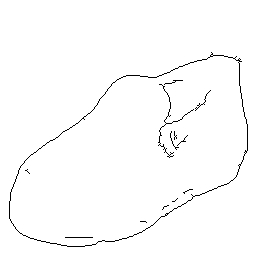

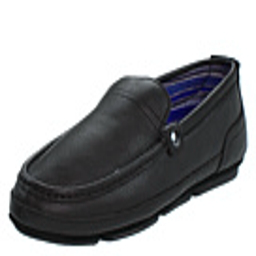

12457


In [27]:
"""
torch.utils.data.Dataset is an abstract class representing a dataset. Your custom dataset should inherit Dataset and override the following methods:

__len__ so that len(dataset) returns the size of the dataset.
__getitem__ to support indexing such that dataset[i] can be used to get :math:i th sample
"""
class CycleGANDataset(Dataset):
  def __init__(self, path):
    super().__init__()
    self.path= path
    self.all_data_list = os.listdir(self.path)
    self.length = len(self.all_data_list)

  

  def __len__(self):
    return self.length
    
  def __getitem__(self, index):
    image_path =  self.path+"/"+ self.all_data_list[index % self.length ]
    image = np.array(Image.open(image_path).convert("RGB"))
    edge_image, label_image = np.split(image,2, axis=1)
    return (edge_image.reshape(3,256,256), label_image.reshape(3,256,256))

folder_path = "/content/drive/MyDrive/edges2shoes/train"
dataset = CycleGANDataset(path = folder_path)
data_loader = DataLoader(dataset= dataset, batch_size= batch_size, shuffle=True, num_workers=2, pin_memory=True)
for i in enumerate(data_loader):
  index, data = i
  edge, shoe = data
  print("Edge Shape: ", edge.shape, "Shoe Shape: ",shoe.shape)
  cv2_imshow(edge[0].reshape(256,256,3).numpy())
  cv2_imshow(shoe[0].reshape(256,256,3).numpy())
  print(len(data_loader))
  break

**Getting Data**

This image is:  <class 'numpy.ndarray'> with dimensions: (256, 512, 3)
This image is:  <class 'numpy.ndarray'> with dimensions: (256, 256, 3)
This image is:  <class 'numpy.ndarray'> with dimensions: (256, 256, 3)


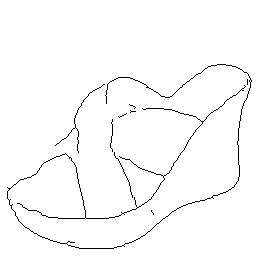

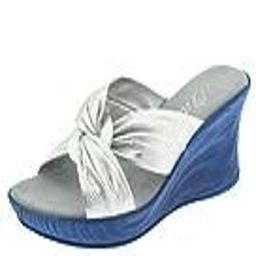

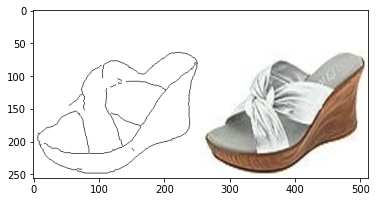

In [28]:
folder_path = "/content/drive/MyDrive/edges2shoes/train"
all_train = os.listdir(folder_path)
test_sample = random.sample(all_train, batch_size)
img_path =  folder_path+"/"+test_sample[0]

img = mpimg.imread(img_path)
print('This image is: ',type(img), 
     'with dimensions:', img.shape)
plt.imshow(img)
edge_img, label_img = np.split(img,2, axis=1)

print('This image is: ',type(edge_img), 
     'with dimensions:', edge_img.shape)

print('This image is: ',type(label_img), 
     'with dimensions:', label_img.shape)

cv2_imshow(edge_img)
cv2_imshow(label_img)


**Functions**


Edges:


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:21: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)


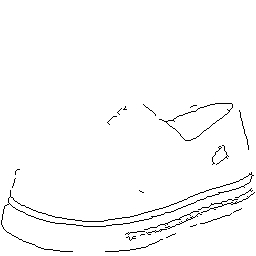

Label :


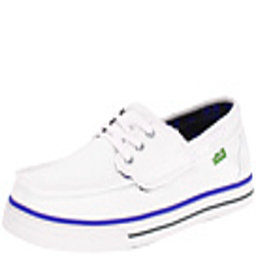

In [9]:
def normalize(x):
  # Denormalizeing 
  pixels = ((x/255)-.5)/.5
  return pixels
def denormalize(x):
  # Denormalizeing 
  pixels =  ((x *.5)+.5)*255
  return pixels

def sample(batchsize):
  folder_path = "/content/drive/MyDrive/edges2shoes/train"
  all_train = os.listdir(folder_path)
  train_data =[]
  label_data =[]
  
  train_sample = random.sample(all_train, batch_size)
  for j in range(batchsize):
    image_path =  folder_path+"/"+ train_sample[j]
    image = mpimg.imread(image_path)
    edge_image, label_image = np.split(image,2, axis=1)
    edge_image = torch.from_numpy(edge_image)
    label_image = torch.from_numpy(label_image)
    train_data.append(edge_image)
    label_data.append(label_image)
  
  train_data = torch.stack(train_data).reshape(batchsize, 3, 256, 256).to(torch.float) # E
  label_data = torch.stack(label_data).reshape(batchsize, 3, 256, 256).to(torch.float) # S
  return (train_data, label_data)
def testSample():
    t,l = sample(1)
    print("Edges:")
    cv2_imshow(t.detach().numpy().reshape(256, 256, 3))
    print("Label :")
    cv2_imshow(l.detach().numpy().reshape(256, 256, 3))
testSample()

**Using GPU**

In [2]:

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('device', device)

device cuda


**Loss Functions**

Adveserial Loss

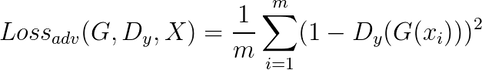

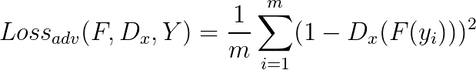

In [3]:
def advLoss(batchsize,D_of_G_of_x):
  l= (1/batchsize)*(1-D_of_G_of_x)**2
  return l.sum()


    
mse = nn.MSELoss() # for disc loss



 cycle consistency loss

 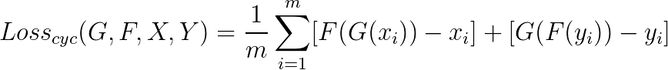

In [4]:
def cycLoss(G2_of__G1_of_E,E , batchsize):
  l = (1/batchsize)*((G2_of__G1_of_E - E))
  return l.sum()

L1 = nn.L1Loss() #for cyclic loss
  

**Generator**

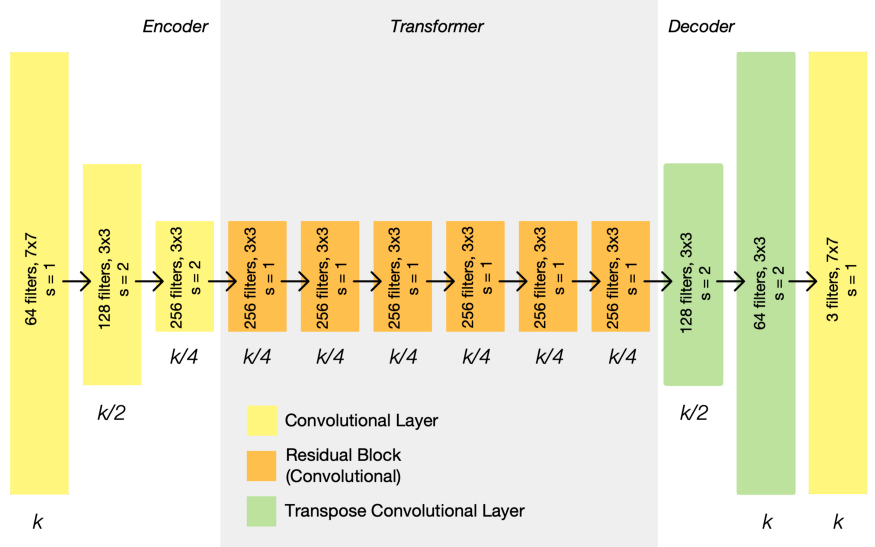

An architecture for a CycleGAN generator. As you can see above, the representation size shrinks in the encoder phase, stays constant in the transformer phase, and expands again in the decoder phase. The representation size that each layer outputs is listed below it, in terms of the input image size, k. On each layer is listed the number of filters, the size of those filters, and the stride. Each layer is followed by an instance normalization and ReLU activation.

In [10]:

class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels, down=True, use_act=True, **kwargs):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, padding_mode="reflect", **kwargs)
            if down
            else nn.ConvTranspose2d(in_channels, out_channels, **kwargs),
            nn.InstanceNorm2d(out_channels),
            nn.ReLU(inplace=True) if use_act else nn.Identity()
        )

    def forward(self, x):
        return self.conv(x)

class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super().__init__()
        self.block = nn.Sequential(
            ConvBlock(channels, channels, kernel_size=3, padding=1),
            ConvBlock(channels, channels, use_act=False, kernel_size=3, padding=1),
        )

    def forward(self, x):
        return x + self.block(x)

class Generator(nn.Module):
    def __init__(self, img_channels, num_features = 64, num_residuals=9):
        super().__init__()
        self.initial = nn.Sequential(
            nn.Conv2d(img_channels, num_features, kernel_size=7, stride=1, padding=3, padding_mode="reflect"),
            nn.InstanceNorm2d(num_features),
            nn.ReLU(inplace=True),
        )
        self.down_blocks = nn.ModuleList(
            [
                ConvBlock(num_features, num_features*2, kernel_size=3, stride=2, padding=1),
                ConvBlock(num_features*2, num_features*4, kernel_size=3, stride=2, padding=1),
            ]
        )
        self.res_blocks = nn.Sequential(
            *[ResidualBlock(num_features*4) for _ in range(num_residuals)]
        )
        self.up_blocks = nn.ModuleList(
            [
                ConvBlock(num_features*4, num_features*2, down=False, kernel_size=3, stride=2, padding=1, output_padding=1),
                ConvBlock(num_features*2, num_features*1, down=False, kernel_size=3, stride=2, padding=1, output_padding=1),
            ]
        )

        self.last = nn.Conv2d(num_features*1, img_channels, kernel_size=7, stride=1, padding=3, padding_mode="reflect")

    def forward(self, x):
        x = self.initial(x)
        for layer in self.down_blocks:
            x = layer(x)
        x = self.res_blocks(x)
        for layer in self.up_blocks:
            x = layer(x)
        return torch.tanh(self.last(x))

def testG():
    img_channels = 3
    img_size = 256
    x = torch.randn((2, img_channels, img_size, img_size))
    gen = Generator(img_channels, 9)
    print(gen(x).shape)
testG()
gen1 = Generator(image_channels ,9).to(device)
gen2 = Generator(image_channels,9).to(device)

torch.Size([2, 3, 256, 256])


**Discriminator**
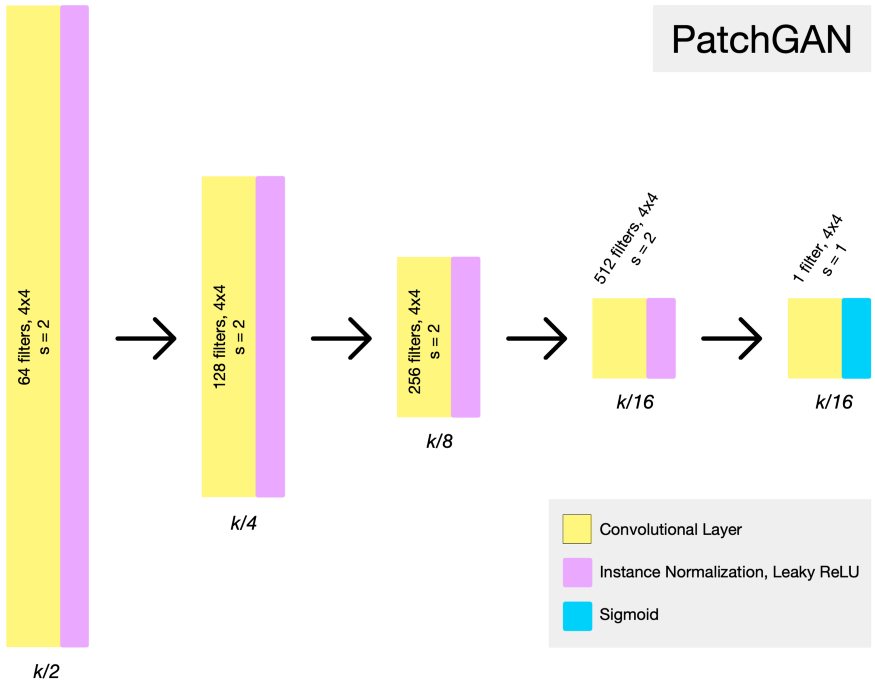


An example architecture for a PatchGAN discriminator. PatchGAN is a fully convolutional network, that takes in an image, and produces a matrix of probabilities, each referring to the probability of the corresponding “patch” of the image being “real” (as opposed to generated). The representation size that each layer outputs is listed below it, in terms of the input image size, k. On each layer is listed the number of filters, the size of those filters, and the stride.

In [11]:
class Block(nn.Module):
    def __init__(self, in_channels, out_channels, stride):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 4, stride, 1, bias=True, padding_mode="reflect"),
            nn.InstanceNorm2d(out_channels),
            nn.LeakyReLU(0.2, inplace=True),
        )

    def forward(self, x):
        return self.conv(x)


class Discriminator(nn.Module):
    def __init__(self, in_channels=3, features=[64, 128, 256, 512]):
        super().__init__()
        self.initial = nn.Sequential(
            nn.Conv2d(
                in_channels,
                features[0],
                kernel_size=4,
                stride=2,
                padding=1,
                padding_mode="reflect",
            ),
            nn.LeakyReLU(0.2, inplace=True),
        )

        layers = []
        in_channels = features[0]
        for feature in features[1:]:
            layers.append(Block(in_channels, feature, stride=1 if feature==features[-1] else 2))
            in_channels = feature
        layers.append(nn.Conv2d(in_channels, 1, kernel_size=4, stride=1, padding=1, padding_mode="reflect"))
        self.model = nn.Sequential(*layers)

    def forward(self, x):
        x = self.initial(x)
        return torch.sigmoid(self.model(x))

def testD():
    x = torch.randn((5, 3, 256, 256))
    model = Discriminator(in_channels=3)
    preds = model(x)
    print(preds.shape)




testD()
disc1= Discriminator().to(device)
disc2= Discriminator().to(device)

torch.Size([5, 1, 30, 30])


**Training**


Epoch : 0 Index :  0
Real Shoe:


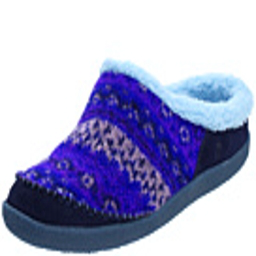

Generated Shoe:


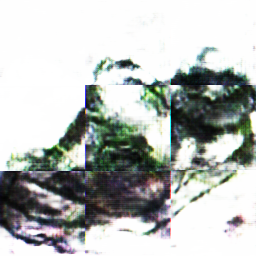

Shoe Loss : 8184.0405
Real Edge:


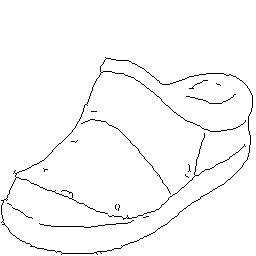

Generated Edge:


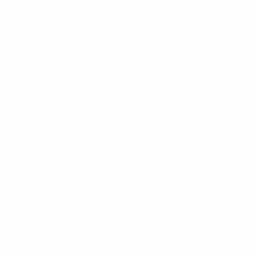

Edge Loss : 1456.4199
Epoch : 0 Index :  10
Real Shoe:


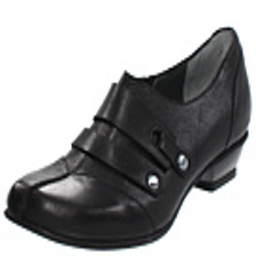

Generated Shoe:


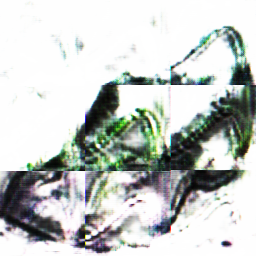

Shoe Loss : 9561.331
Real Edge:


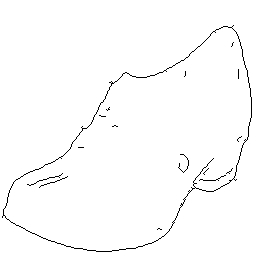

Generated Edge:


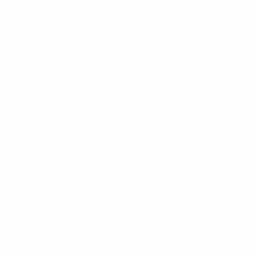

Edge Loss : 935.5166
Epoch : 0 Index :  20
Real Shoe:


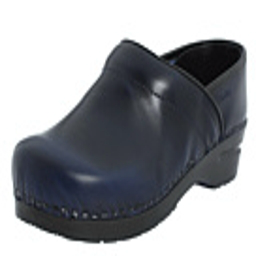

Generated Shoe:


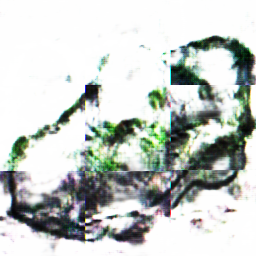

Shoe Loss : 10615.307
Real Edge:


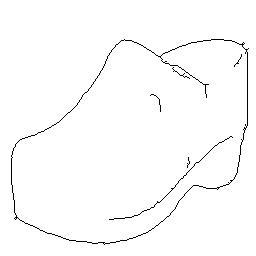

Generated Edge:


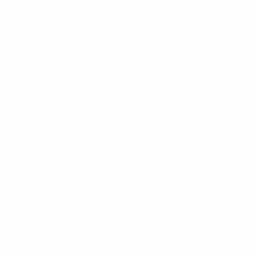

Edge Loss : 968.2926
Epoch : 0 Index :  30
Real Shoe:


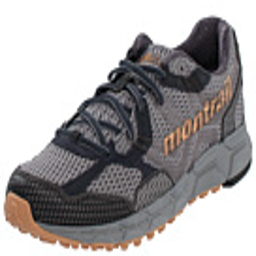

Generated Shoe:


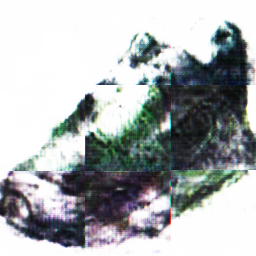

Shoe Loss : 6136.2764
Real Edge:


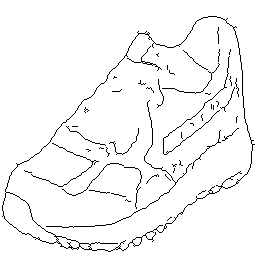

Generated Edge:


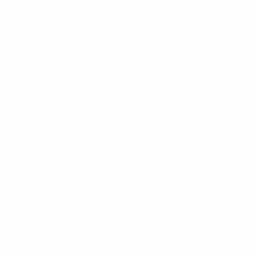

Edge Loss : 2370.0479
Epoch : 0 Index :  40
Real Shoe:


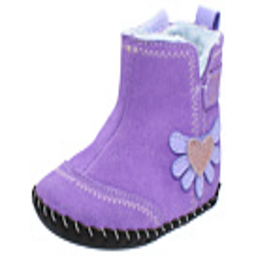

Generated Shoe:


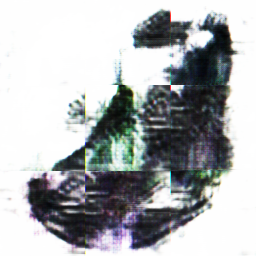

Shoe Loss : 6560.87
Real Edge:


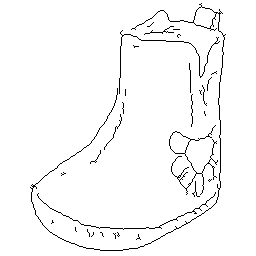

Generated Edge:


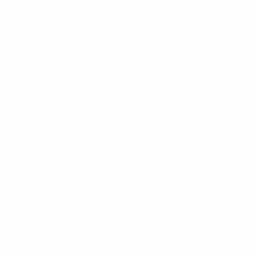

Edge Loss : 1743.0692
Epoch : 0 Index :  50
Real Shoe:


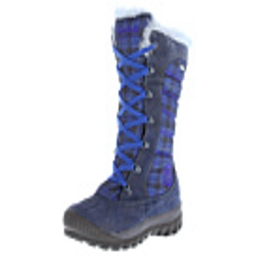

Generated Shoe:


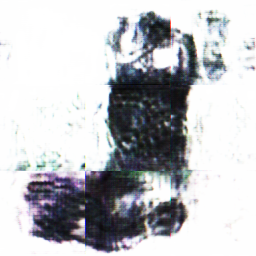

Shoe Loss : 4957.3076
Real Edge:


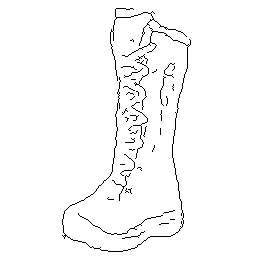

Generated Edge:


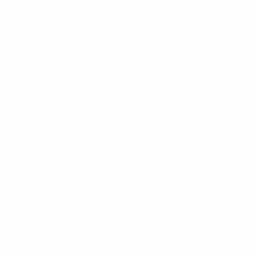

Edge Loss : 1496.123
Epoch : 0 Index :  60
Real Shoe:


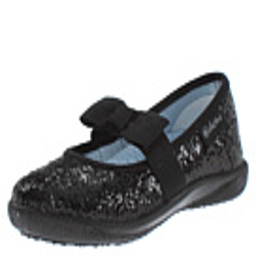

Generated Shoe:


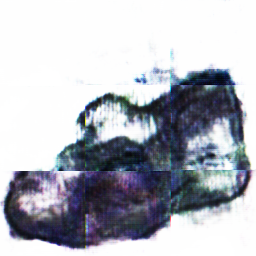

Shoe Loss : 4175.1123
Real Edge:


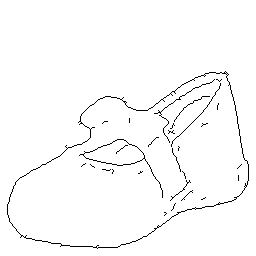

Generated Edge:


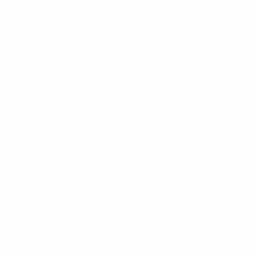

Edge Loss : 1279.7045
Epoch : 0 Index :  70
Real Shoe:


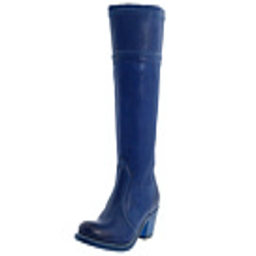

Generated Shoe:


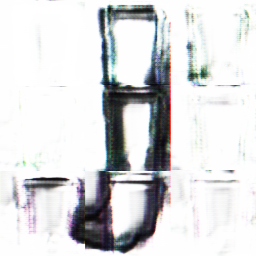

Shoe Loss : 6531.2573
Real Edge:


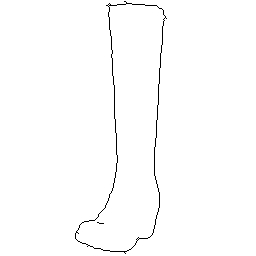

Generated Edge:


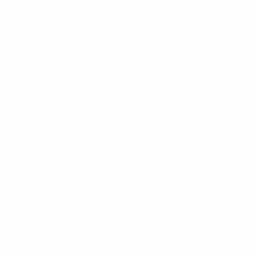

Edge Loss : 619.0725
Epoch : 0 Index :  80
Real Shoe:


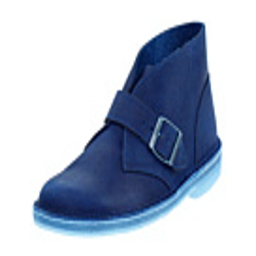

Generated Shoe:


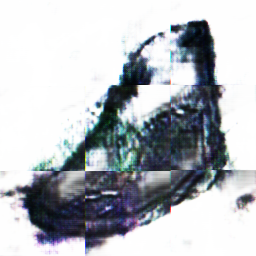

Shoe Loss : 5347.99
Real Edge:


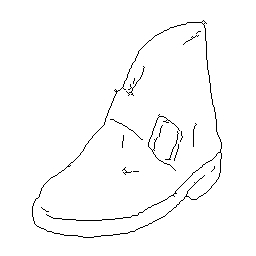

Generated Edge:


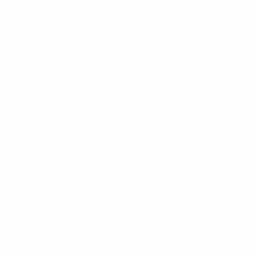

Edge Loss : 1162.7406
Epoch : 0 Index :  90
Real Shoe:


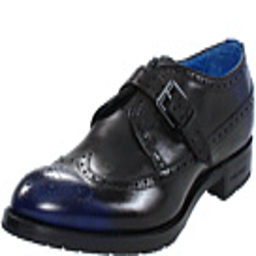

Generated Shoe:


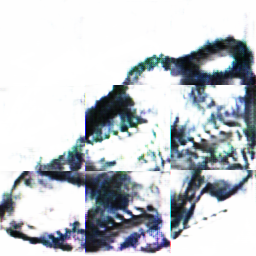

Shoe Loss : 10675.78
Real Edge:


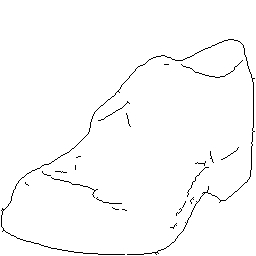

Generated Edge:


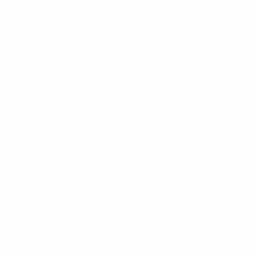

Edge Loss : 1071.4497
Epoch : 0 Index :  100
Real Shoe:


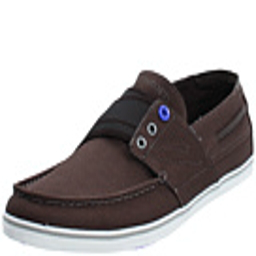

Generated Shoe:


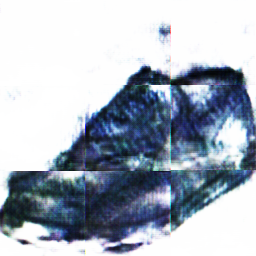

Shoe Loss : 4188.9756
Real Edge:


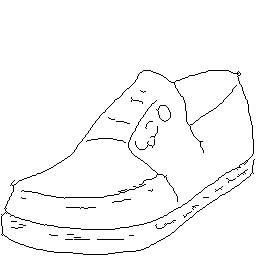

Generated Edge:


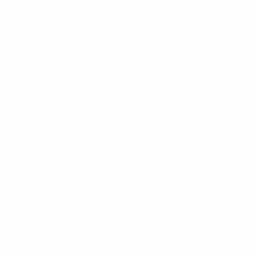

Edge Loss : 1734.0786
Epoch : 0 Index :  110
Real Shoe:


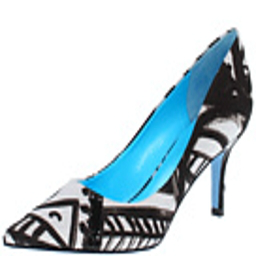

Generated Shoe:


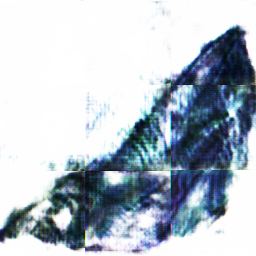

Shoe Loss : 5564.9116
Real Edge:


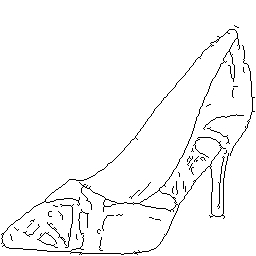

Generated Edge:


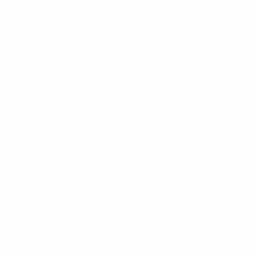

Edge Loss : 1974.141
Epoch : 0 Index :  120
Real Shoe:


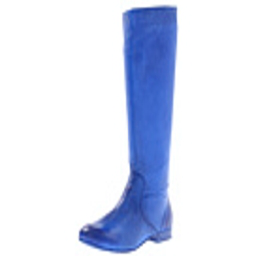

Generated Shoe:


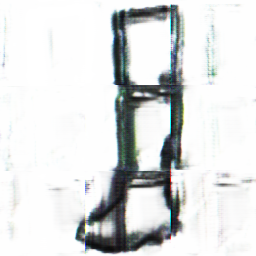

Shoe Loss : 4861.955
Real Edge:


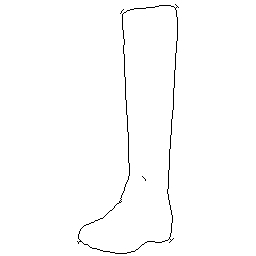

Generated Edge:


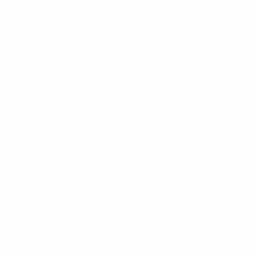

Edge Loss : 633.91425
Epoch : 0 Index :  130
Real Shoe:


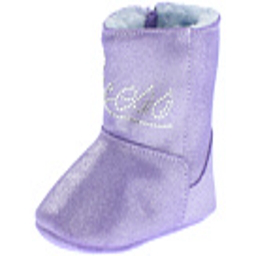

Generated Shoe:


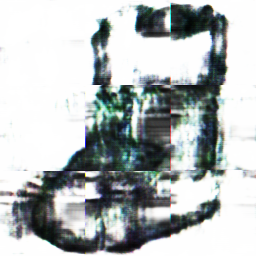

Shoe Loss : 7318.695
Real Edge:


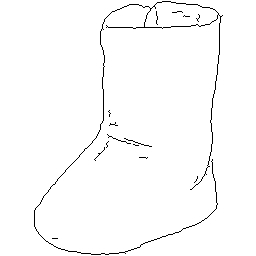

Generated Edge:


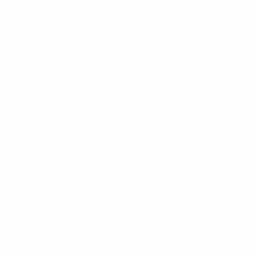

Edge Loss : 1035.7463
Epoch : 0 Index :  140
Real Shoe:


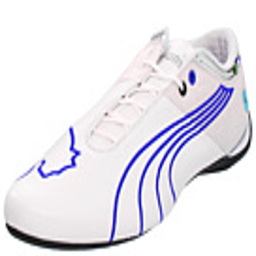

Generated Shoe:


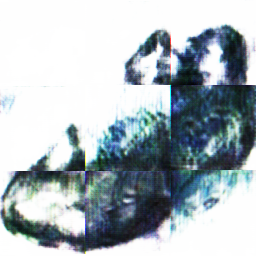

Shoe Loss : 8666.901
Real Edge:


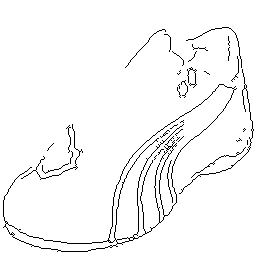

Generated Edge:


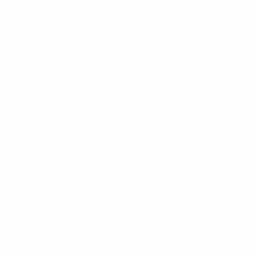

Edge Loss : 2127.7974
Epoch : 0 Index :  150
Real Shoe:


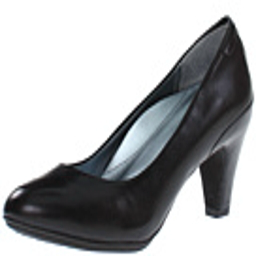

Generated Shoe:


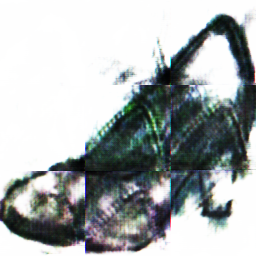

Shoe Loss : 6560.4883
Real Edge:


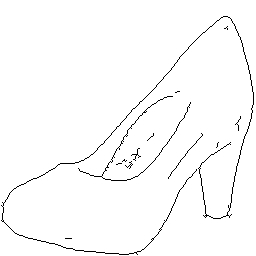

Generated Edge:


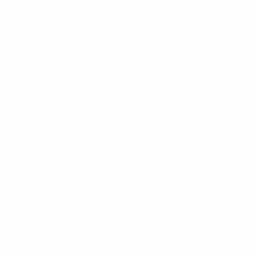

Edge Loss : 1195.4312
Epoch : 0 Index :  160
Real Shoe:


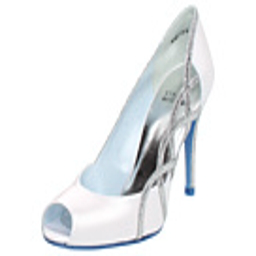

Generated Shoe:


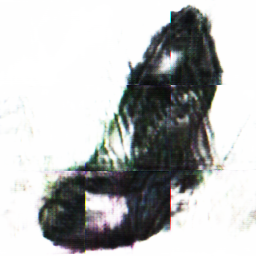

Shoe Loss : 8756.427
Real Edge:


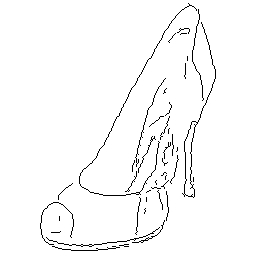

Generated Edge:


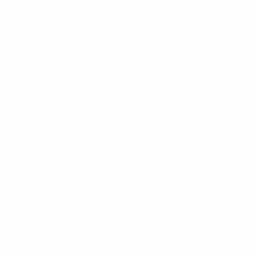

Edge Loss : 1601.1597
Epoch : 0 Index :  170
Real Shoe:


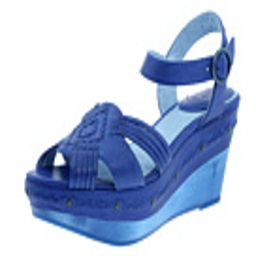

Generated Shoe:


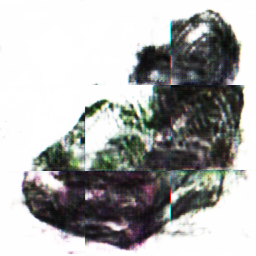

Shoe Loss : 5401.665
Real Edge:


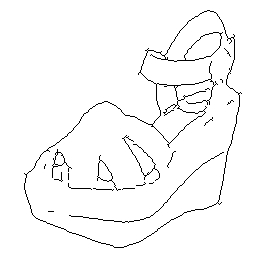

Generated Edge:


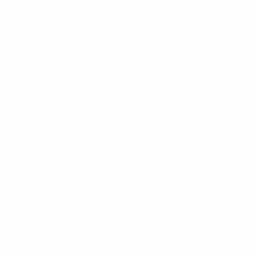

Edge Loss : 1775.7561
Epoch : 0 Index :  180
Real Shoe:


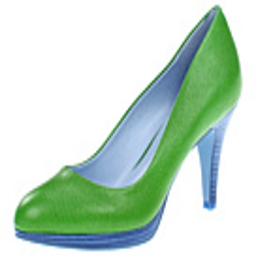

Generated Shoe:


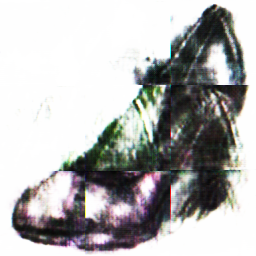

Shoe Loss : 6039.13
Real Edge:


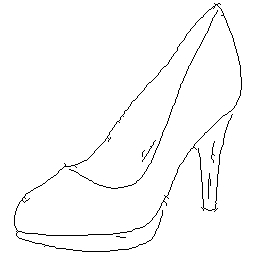

Generated Edge:


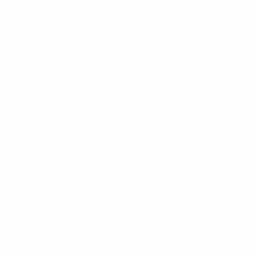

Edge Loss : 1333.3584
Epoch : 0 Index :  190
Real Shoe:


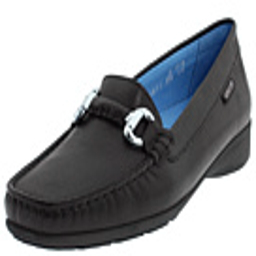

Generated Shoe:


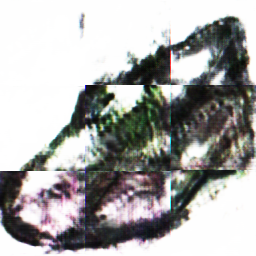

Shoe Loss : 6556.159
Real Edge:


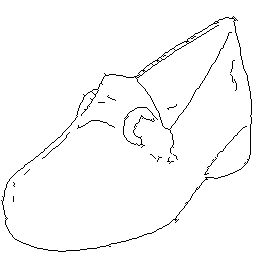

Generated Edge:


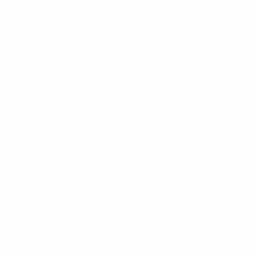

Edge Loss : 1421.6768
Epoch : 0 Index :  200
Real Shoe:


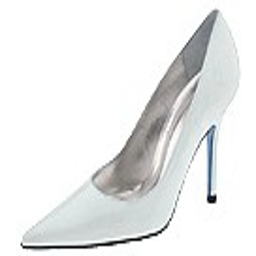

Generated Shoe:


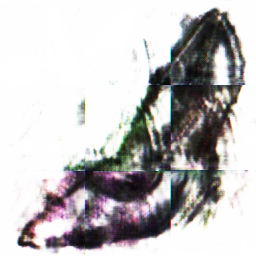

Shoe Loss : 6939.2554
Real Edge:


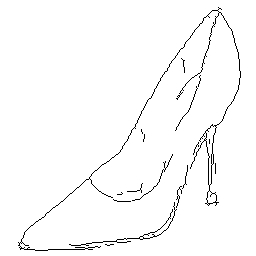

Generated Edge:


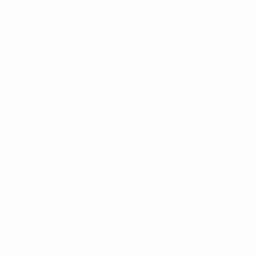

Edge Loss : 1342.162
Epoch : 0 Index :  210
Real Shoe:


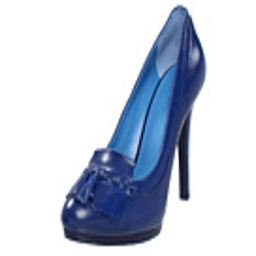

Generated Shoe:


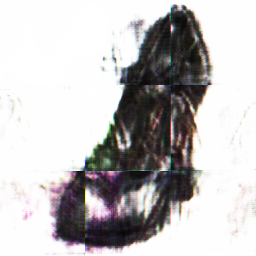

Shoe Loss : 3724.1162
Real Edge:


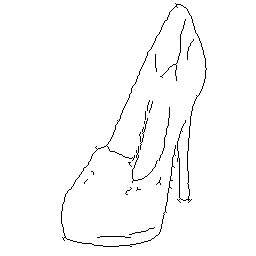

Generated Edge:


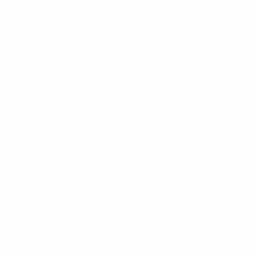

Edge Loss : 1206.3391
Epoch : 0 Index :  220
Real Shoe:


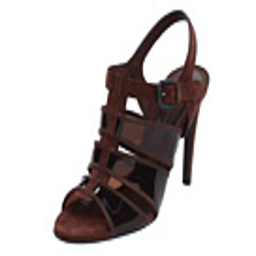

Generated Shoe:


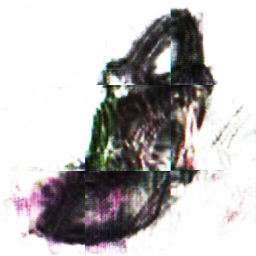

Shoe Loss : 4411.706
Real Edge:


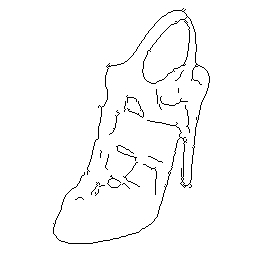

Generated Edge:


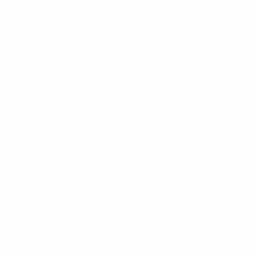

Edge Loss : 1388.8827
Epoch : 0 Index :  230
Real Shoe:


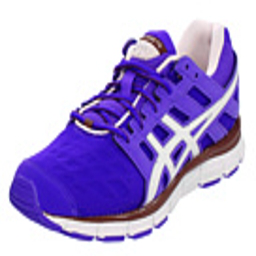

Generated Shoe:


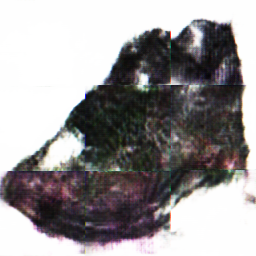

Shoe Loss : 6889.8867
Real Edge:


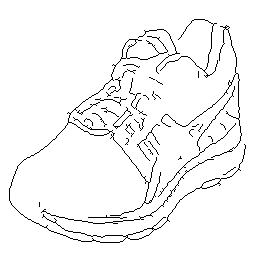

Generated Edge:


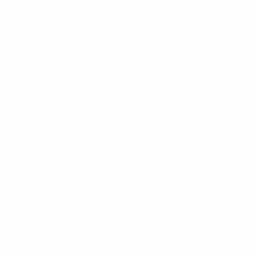

Edge Loss : 2542.5916
Epoch : 0 Index :  240
Real Shoe:


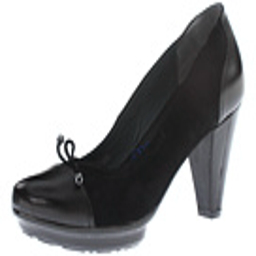

Generated Shoe:


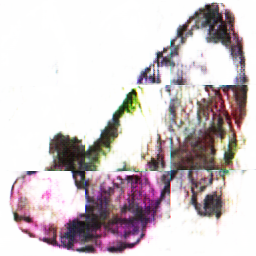

Shoe Loss : 8883.37
Real Edge:


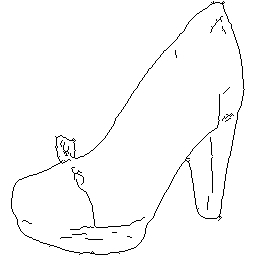

Generated Edge:


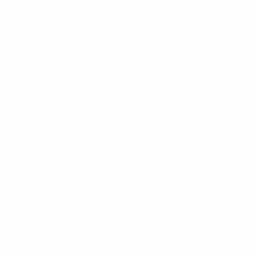

Edge Loss : 1335.3447
Epoch : 0 Index :  250
Real Shoe:


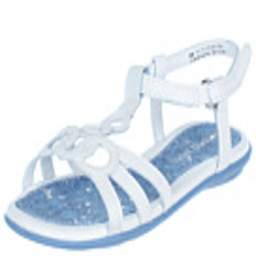

Generated Shoe:


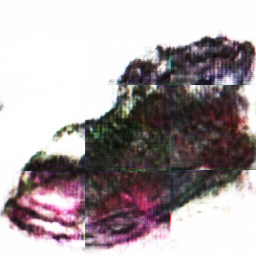

Shoe Loss : 11849.449
Real Edge:


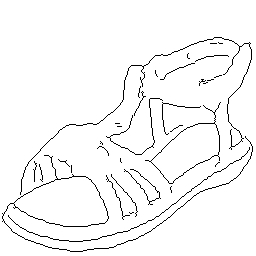

Generated Edge:


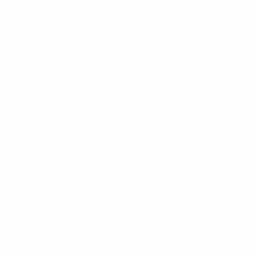

Edge Loss : 2166.7722
Epoch : 0 Index :  260
Real Shoe:


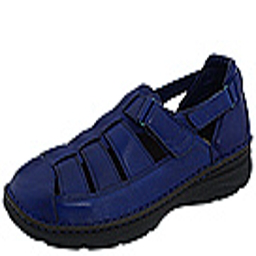

Generated Shoe:


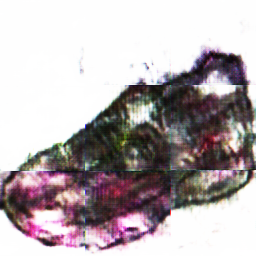

Shoe Loss : 4602.6943
Real Edge:


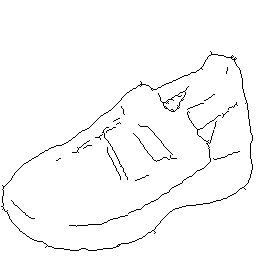

Generated Edge:


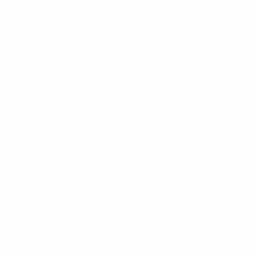

Edge Loss : 1384.9027
Epoch : 0 Index :  270
Real Shoe:


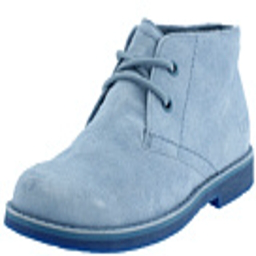

Generated Shoe:


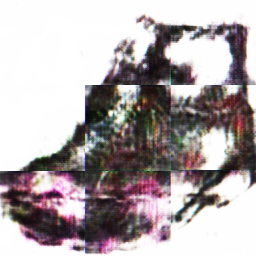

Shoe Loss : 6851.5874
Real Edge:


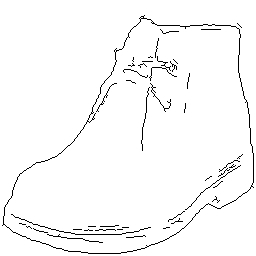

Generated Edge:


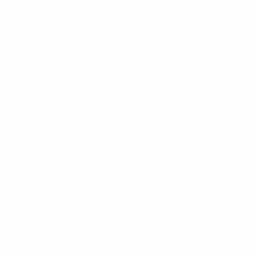

Edge Loss : 1689.5039
Epoch : 0 Index :  280
Real Shoe:


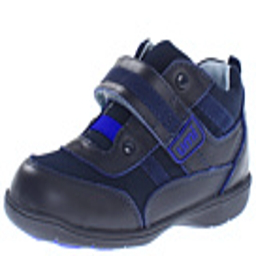

Generated Shoe:


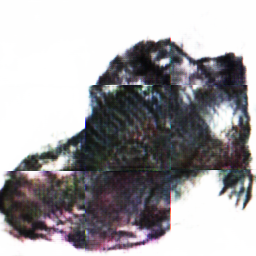

Shoe Loss : 3639.314
Real Edge:


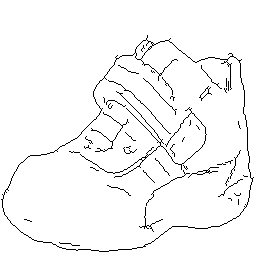

Generated Edge:


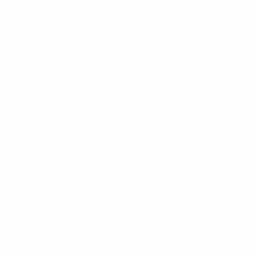

Edge Loss : 2109.1328
Epoch : 0 Index :  290
Real Shoe:


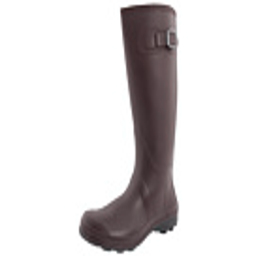

Generated Shoe:


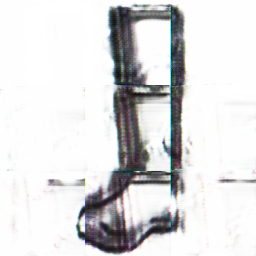

Shoe Loss : 5251.4707
Real Edge:


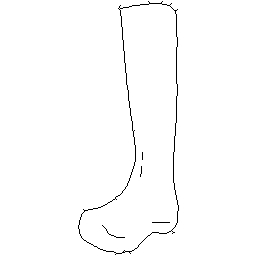

Generated Edge:


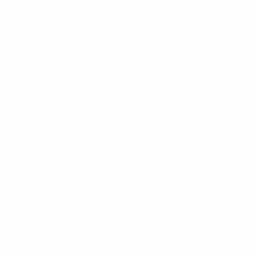

Edge Loss : 696.45483
Epoch : 0 Index :  300
Real Shoe:


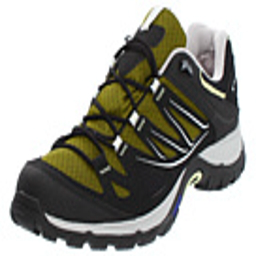

Generated Shoe:


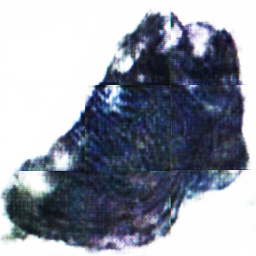

Shoe Loss : 3980.8037
Real Edge:


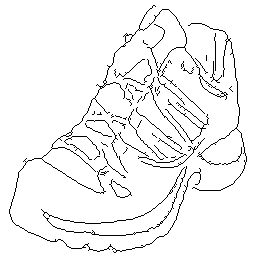

Generated Edge:


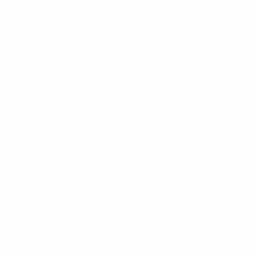

Edge Loss : 3063.4597
Epoch : 0 Index :  310
Real Shoe:


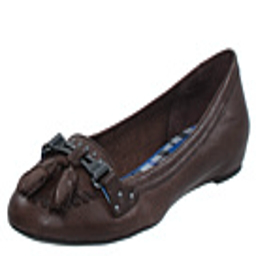

Generated Shoe:


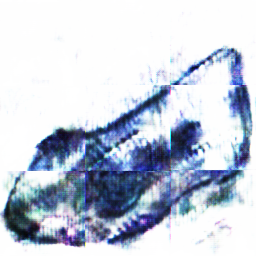

Shoe Loss : 7655.7827
Real Edge:


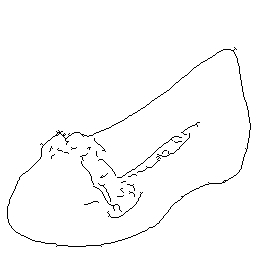

Generated Edge:


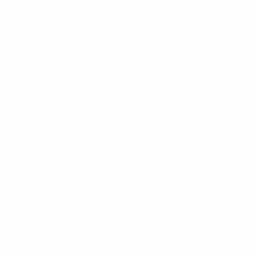

Edge Loss : 1141.8748
Epoch : 0 Index :  320
Real Shoe:


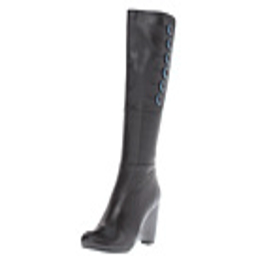

Generated Shoe:


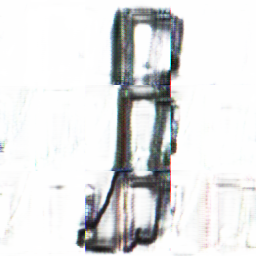

Shoe Loss : 4173.3086
Real Edge:


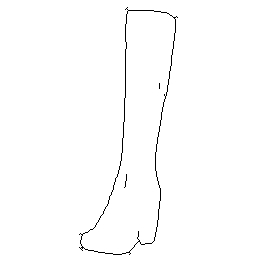

Generated Edge:


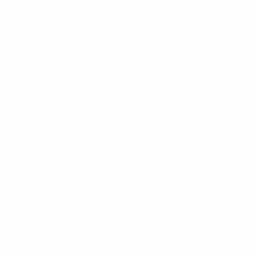

Edge Loss : 630.94745
Epoch : 0 Index :  330
Real Shoe:


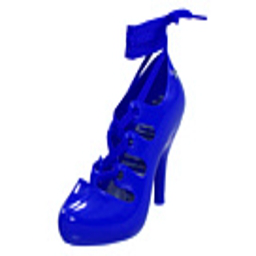

Generated Shoe:


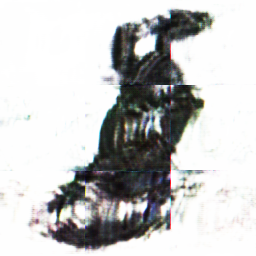

Shoe Loss : 5072.1846
Real Edge:


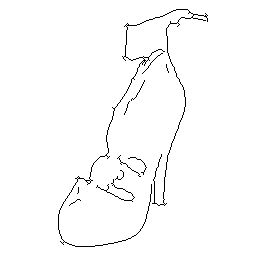

Generated Edge:


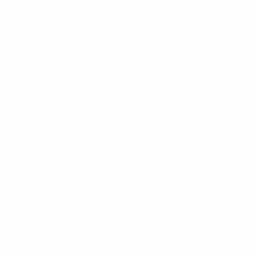

Edge Loss : 1066.405
Epoch : 0 Index :  340
Real Shoe:


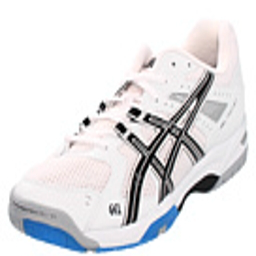

Generated Shoe:


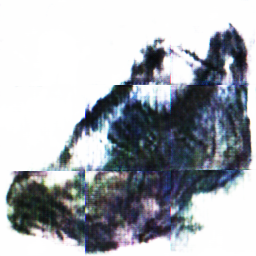

Shoe Loss : 8893.332
Real Edge:


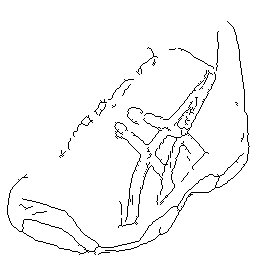

Generated Edge:


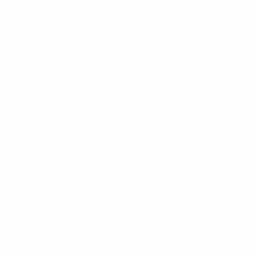

Edge Loss : 2082.252
Epoch : 0 Index :  350
Real Shoe:


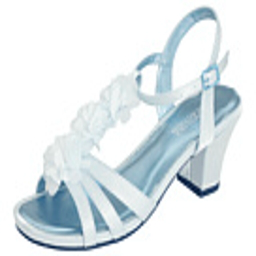

Generated Shoe:


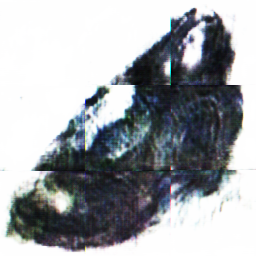

Shoe Loss : 11095.365
Real Edge:


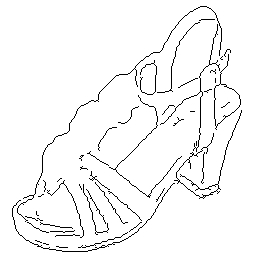

Generated Edge:


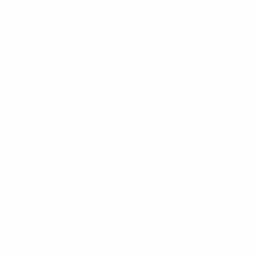

Edge Loss : 2348.1885
Epoch : 0 Index :  360
Real Shoe:


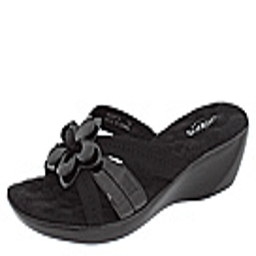

Generated Shoe:


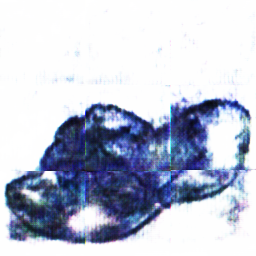

Shoe Loss : 4176.726
Real Edge:


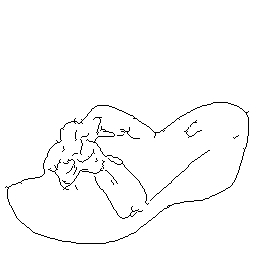

Generated Edge:


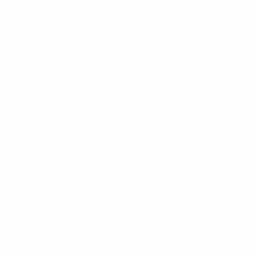

Edge Loss : 1256.0248
Epoch : 0 Index :  370
Real Shoe:


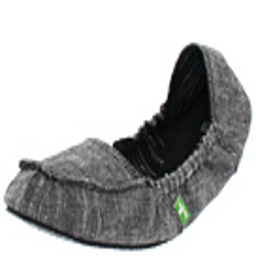

Generated Shoe:


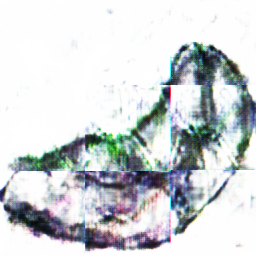

Shoe Loss : 6485.6377
Real Edge:


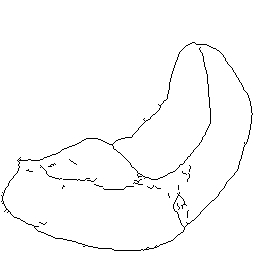

Generated Edge:


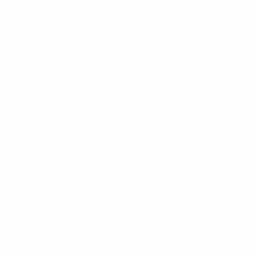

Edge Loss : 1155.7104
Epoch : 0 Index :  380
Real Shoe:


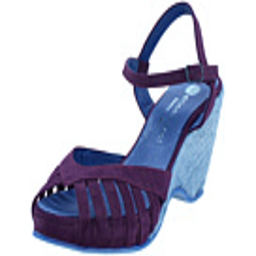

Generated Shoe:


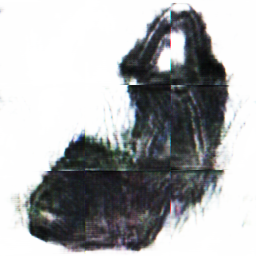

Shoe Loss : 3885.9468
Real Edge:


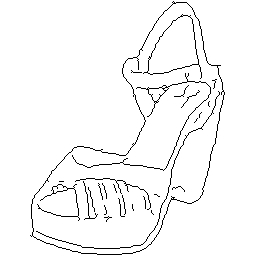

Generated Edge:


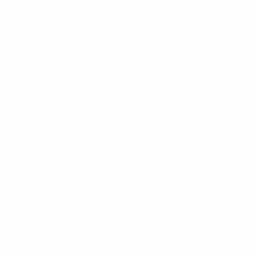

Edge Loss : 2101.0952
Epoch : 0 Index :  390
Real Shoe:


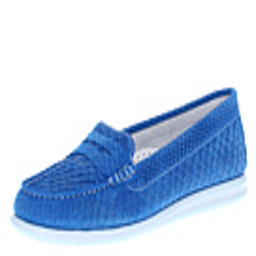

Generated Shoe:


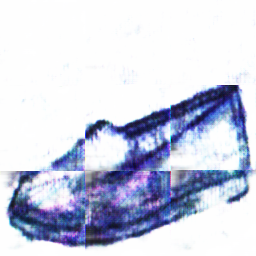

Shoe Loss : 4040.109
Real Edge:


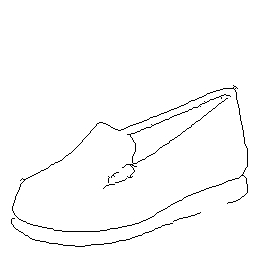

Generated Edge:


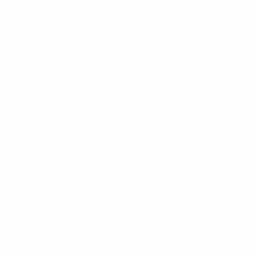

Edge Loss : 1110.1455
Epoch : 0 Index :  400
Real Shoe:


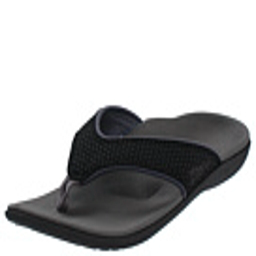

Generated Shoe:


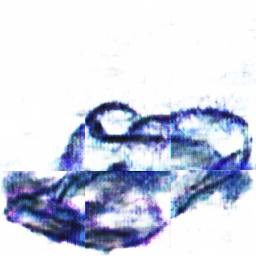

Shoe Loss : 6297.991
Real Edge:


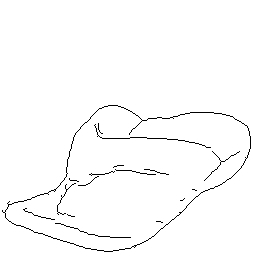

Generated Edge:


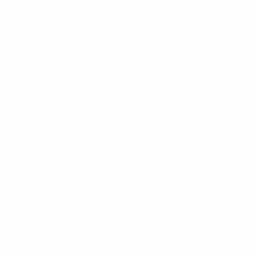

Edge Loss : 1097.2655
Epoch : 0 Index :  410
Real Shoe:


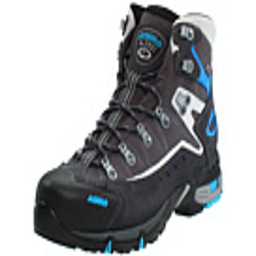

Generated Shoe:


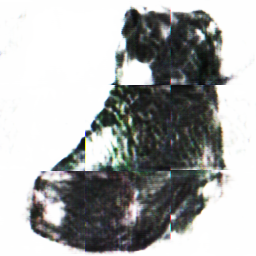

Shoe Loss : 4287.98
Real Edge:


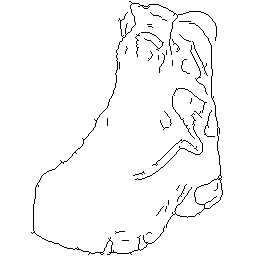

Generated Edge:


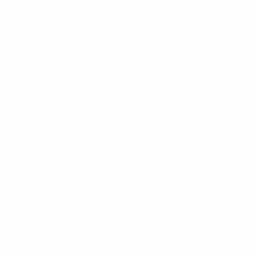

Edge Loss : 1758.8975
Epoch : 0 Index :  420
Real Shoe:


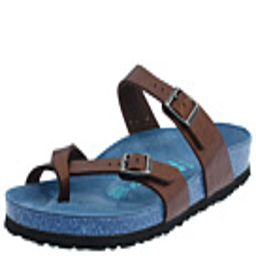

Generated Shoe:


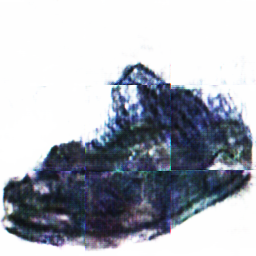

Shoe Loss : 3325.4106
Real Edge:


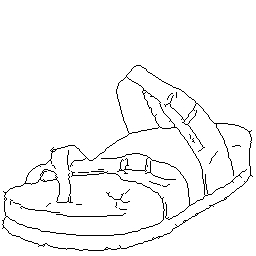

Generated Edge:


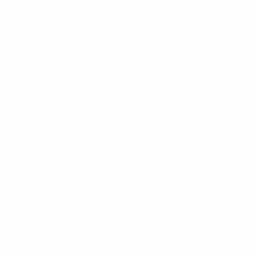

Edge Loss : 2167.4893
Epoch : 0 Index :  430
Real Shoe:


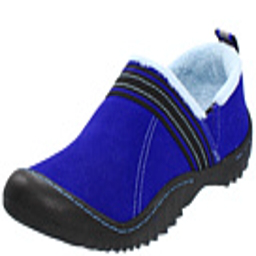

Generated Shoe:


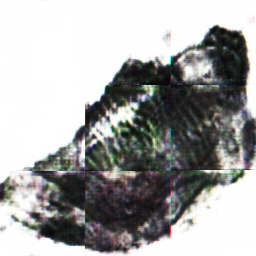

Shoe Loss : 5132.933
Real Edge:


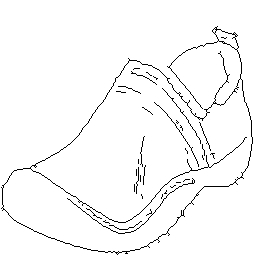

Generated Edge:


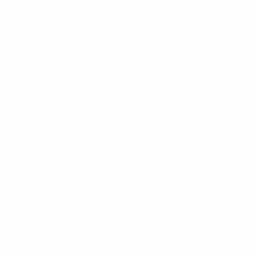

Edge Loss : 1886.8945
Epoch : 0 Index :  440
Real Shoe:


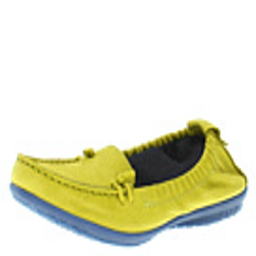

Generated Shoe:


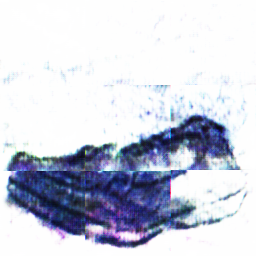

Shoe Loss : 4477.638
Real Edge:


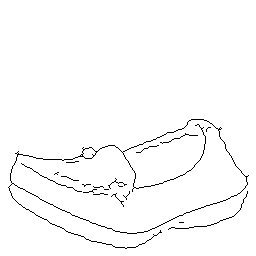

Generated Edge:


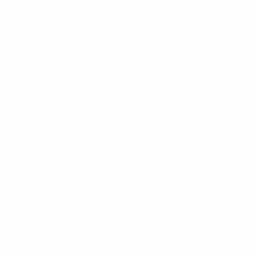

Edge Loss : 1247.988
Epoch : 0 Index :  450
Real Shoe:


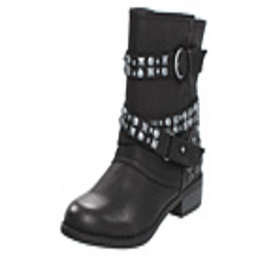

Generated Shoe:


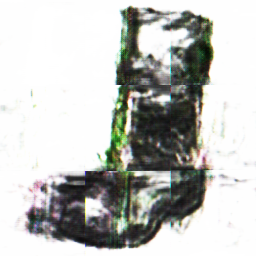

Shoe Loss : 4568.6797
Real Edge:


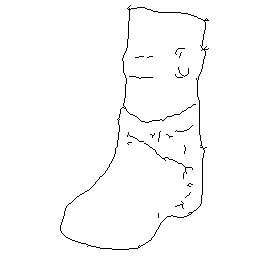

Generated Edge:


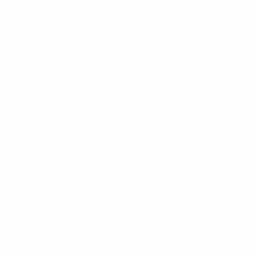

Edge Loss : 1012.9072
Epoch : 0 Index :  460
Real Shoe:


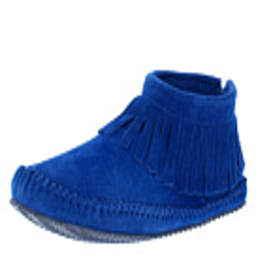

Generated Shoe:


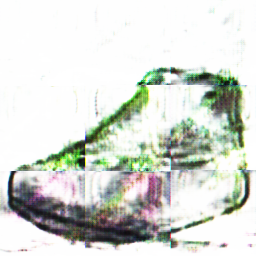

Shoe Loss : 9180.0
Real Edge:


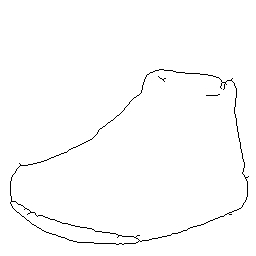

Generated Edge:


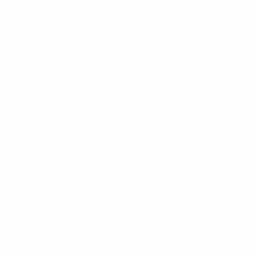

Edge Loss : 806.5451
Epoch : 0 Index :  470
Real Shoe:


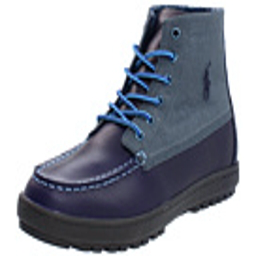

Generated Shoe:


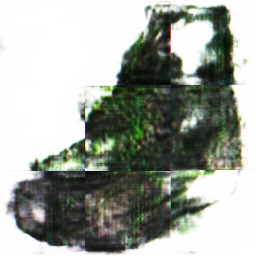

Shoe Loss : 4252.336
Real Edge:


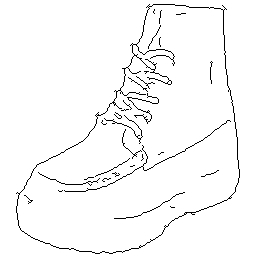

Generated Edge:


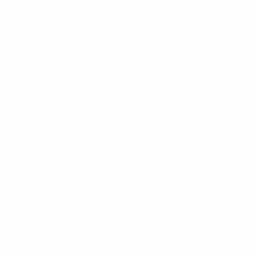

Edge Loss : 1862.0559
Epoch : 0 Index :  480
Real Shoe:


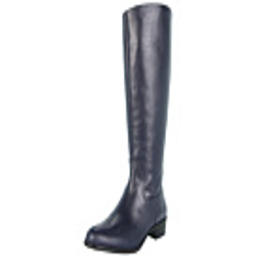

Generated Shoe:


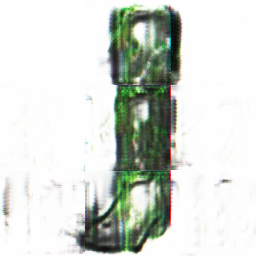

Shoe Loss : 3223.8506
Real Edge:


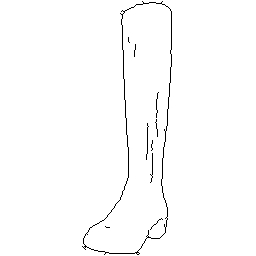

Generated Edge:


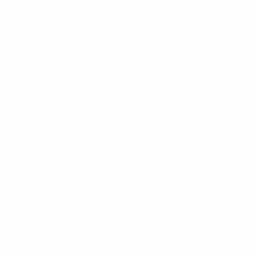

Edge Loss : 787.7033
Epoch : 0 Index :  490
Real Shoe:


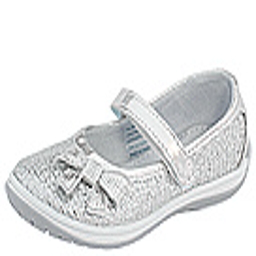

Generated Shoe:


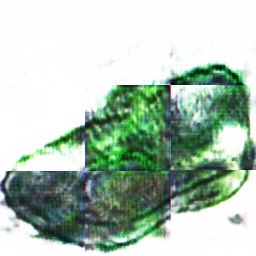

Shoe Loss : 6865.388
Real Edge:


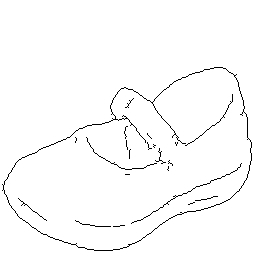

Generated Edge:


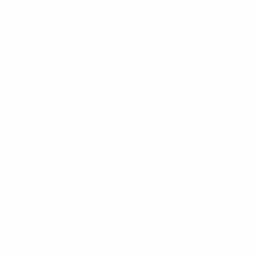

Edge Loss : 1236.1265
Epoch : 0 Index :  500
Real Shoe:


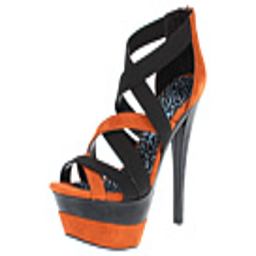

Generated Shoe:


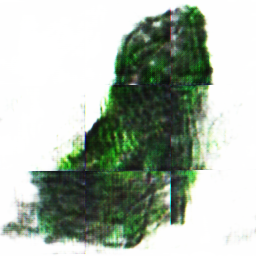

Shoe Loss : 4779.3193
Real Edge:


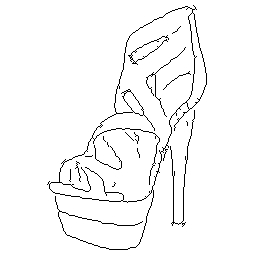

Generated Edge:


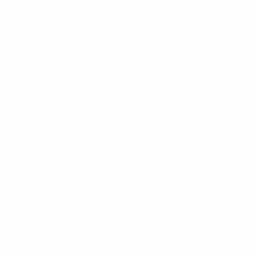

Edge Loss : 1933.5371
Epoch : 0 Index :  510
Real Shoe:


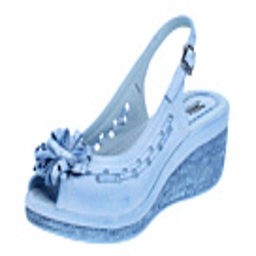

Generated Shoe:


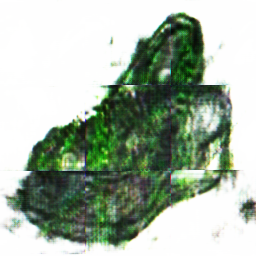

Shoe Loss : 8594.998
Real Edge:


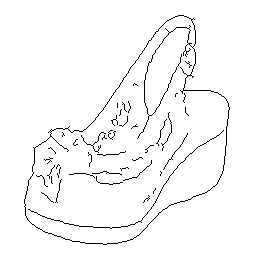

Generated Edge:


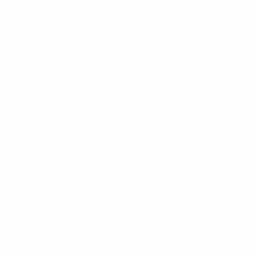

Edge Loss : 1815.3906
Epoch : 0 Index :  520
Real Shoe:


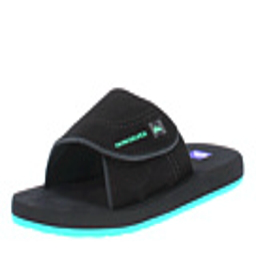

Generated Shoe:


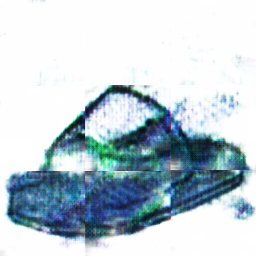

Shoe Loss : 4395.7437
Real Edge:


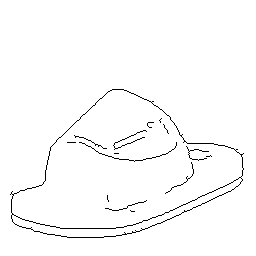

Generated Edge:


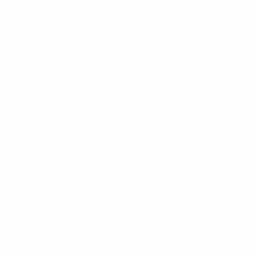

Edge Loss : 1195.4573
Epoch : 0 Index :  530
Real Shoe:


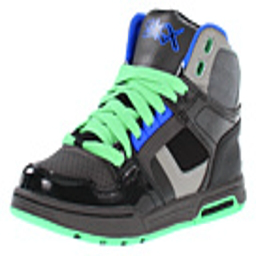

Generated Shoe:


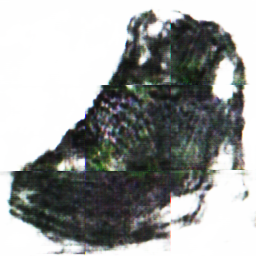

Shoe Loss : 5205.1777
Real Edge:


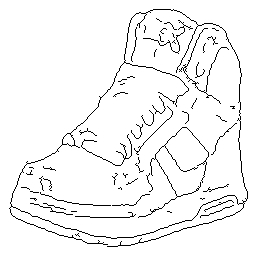

Generated Edge:


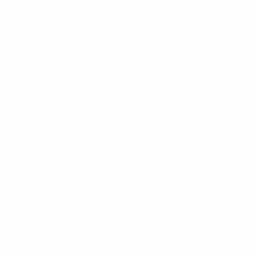

Edge Loss : 2860.9714
Epoch : 0 Index :  540
Real Shoe:


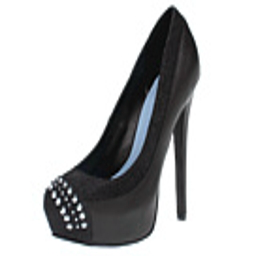

Generated Shoe:


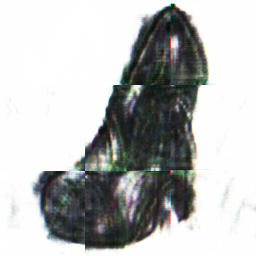

Shoe Loss : 3341.4363
Real Edge:


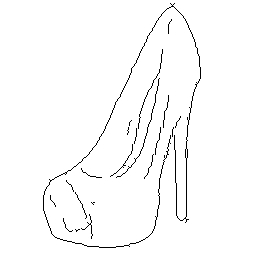

Generated Edge:


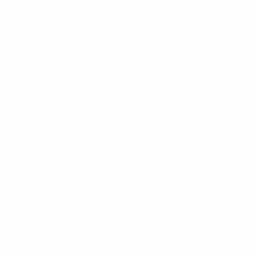

Edge Loss : 1288.6799
Epoch : 0 Index :  550
Real Shoe:


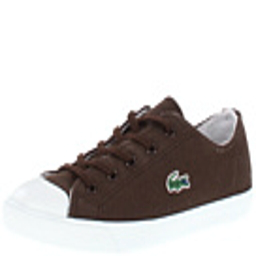

Generated Shoe:


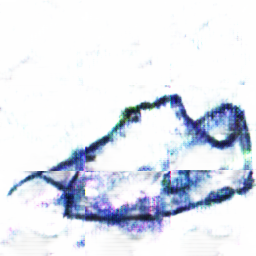

Shoe Loss : 6616.1694
Real Edge:


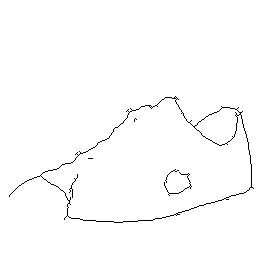

Generated Edge:


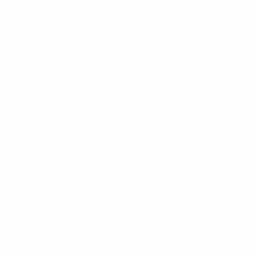

Edge Loss : 792.6818
Epoch : 0 Index :  560
Real Shoe:


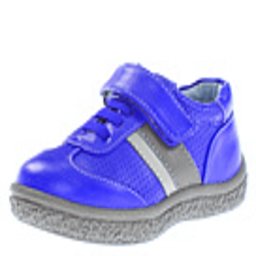

Generated Shoe:


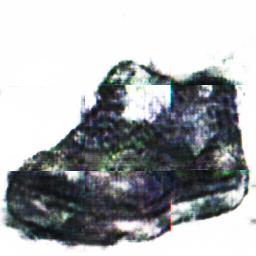

Shoe Loss : 6011.4663
Real Edge:


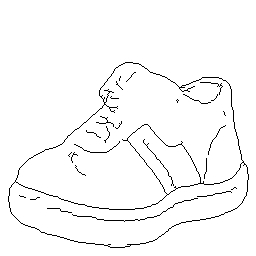

Generated Edge:


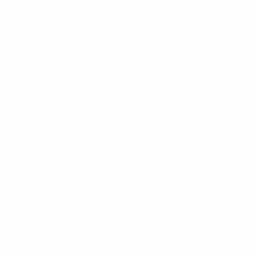

Edge Loss : 1687.4999
Epoch : 0 Index :  570
Real Shoe:


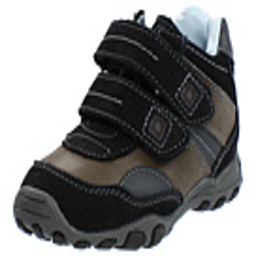

Generated Shoe:


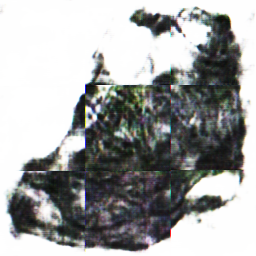

Shoe Loss : 6881.288
Real Edge:


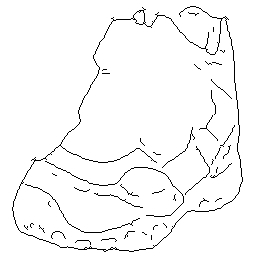

Generated Edge:


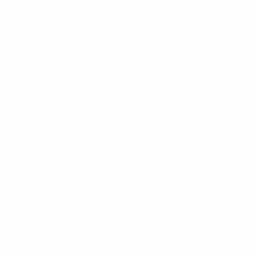

Edge Loss : 1931.5726
Epoch : 0 Index :  580
Real Shoe:


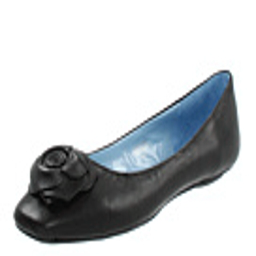

Generated Shoe:


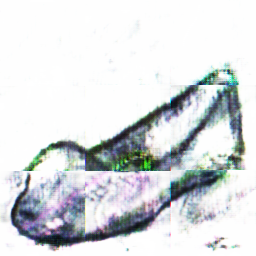

Shoe Loss : 6062.6323
Real Edge:


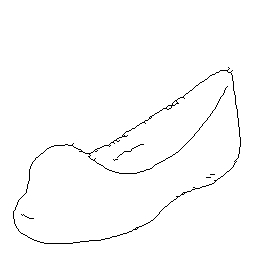

Generated Edge:


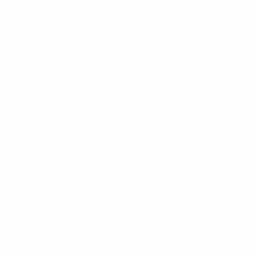

Edge Loss : 853.19775
Epoch : 0 Index :  590
Real Shoe:


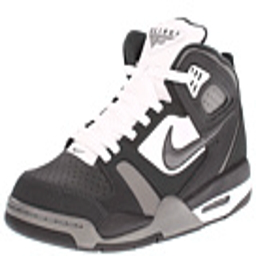

Generated Shoe:


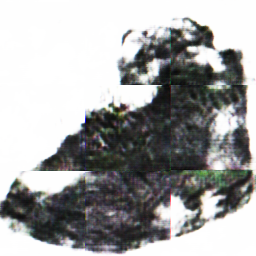

Shoe Loss : 7173.917
Real Edge:


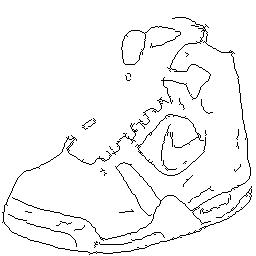

Generated Edge:


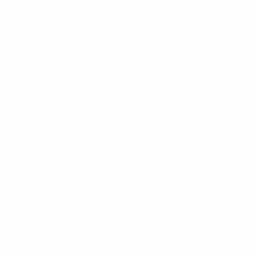

Edge Loss : 2432.5293
Epoch : 0 Index :  600
Real Shoe:


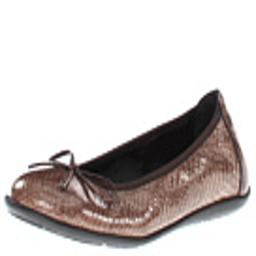

Generated Shoe:


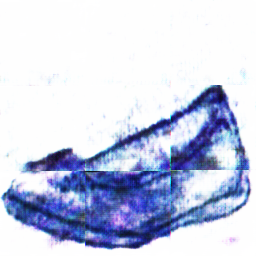

Shoe Loss : 4595.9224
Real Edge:


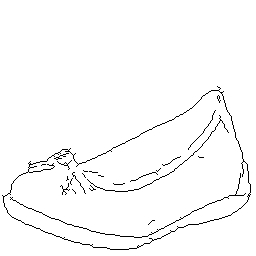

Generated Edge:


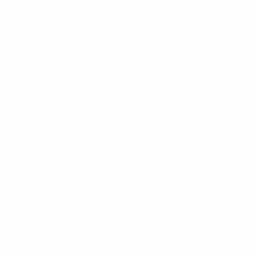

Edge Loss : 1402.6831
Epoch : 0 Index :  610
Real Shoe:


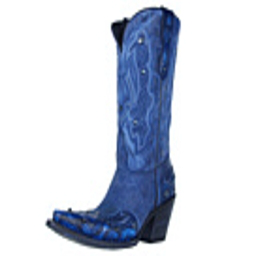

Generated Shoe:


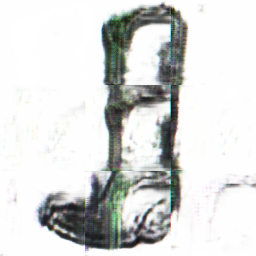

Shoe Loss : 4503.644
Real Edge:


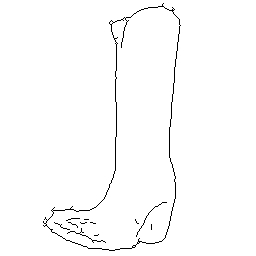

Generated Edge:


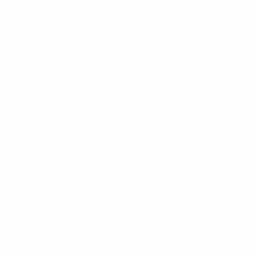

Edge Loss : 886.88617
Epoch : 0 Index :  620
Real Shoe:


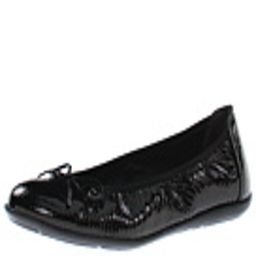

Generated Shoe:


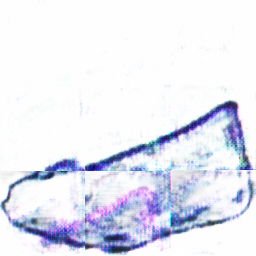

Shoe Loss : 10414.043
Real Edge:


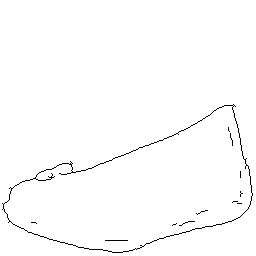

Generated Edge:


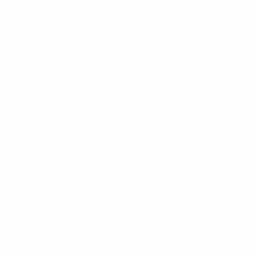

Edge Loss : 765.827
Epoch : 0 Index :  630
Real Shoe:


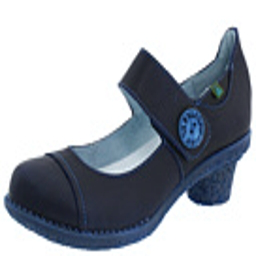

Generated Shoe:


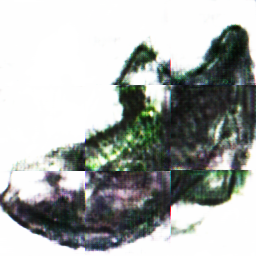

Shoe Loss : 4420.842
Real Edge:


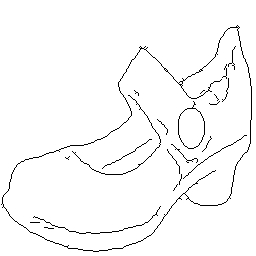

Generated Edge:


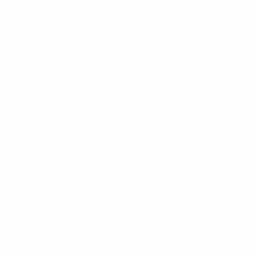

Edge Loss : 1618.1044
Epoch : 0 Index :  640
Real Shoe:


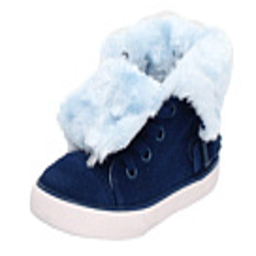

Generated Shoe:


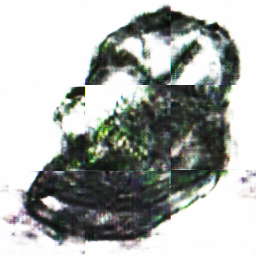

Shoe Loss : 7380.0757
Real Edge:


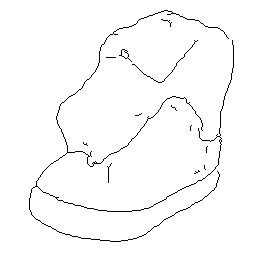

Generated Edge:


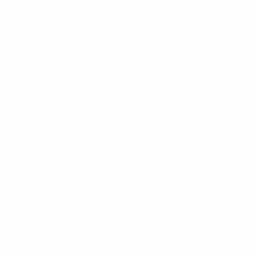

Edge Loss : 1251.0641
Epoch : 0 Index :  650
Real Shoe:


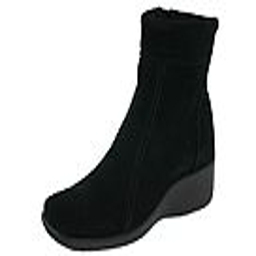

Generated Shoe:


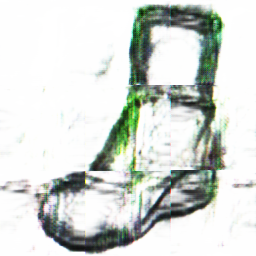

Shoe Loss : 11505.568
Real Edge:


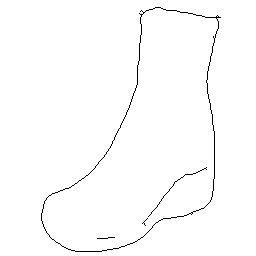

Generated Edge:


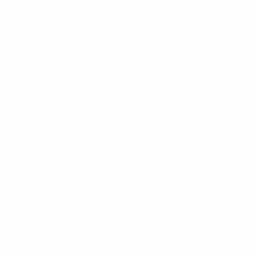

Edge Loss : 766.8895
Epoch : 0 Index :  660
Real Shoe:


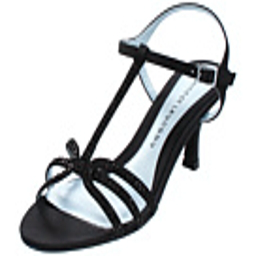

Generated Shoe:


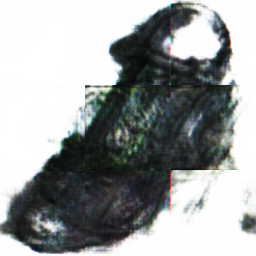

Shoe Loss : 9034.379
Real Edge:


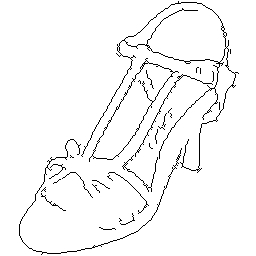

Generated Edge:


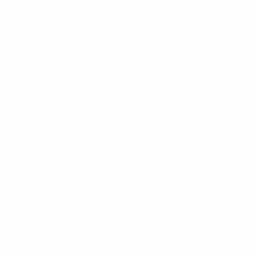

Edge Loss : 2133.8948
Epoch : 0 Index :  670
Real Shoe:


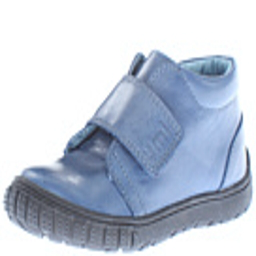

Generated Shoe:


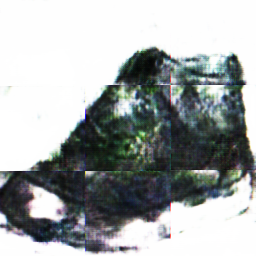

Shoe Loss : 6765.036
Real Edge:


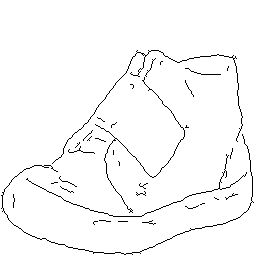

Generated Edge:


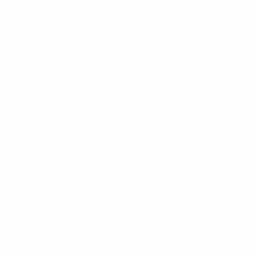

Edge Loss : 1646.8809
Epoch : 0 Index :  680
Real Shoe:


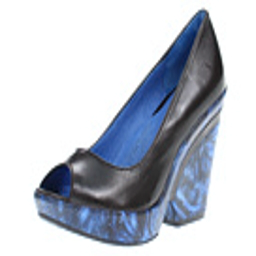

Generated Shoe:


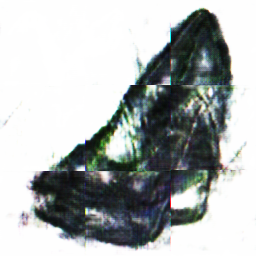

Shoe Loss : 3534.9507
Real Edge:


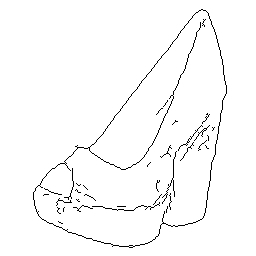

Generated Edge:


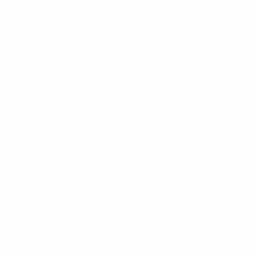

Edge Loss : 1397.7087
Epoch : 0 Index :  690
Real Shoe:


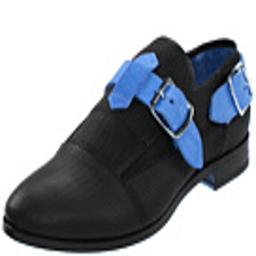

Generated Shoe:


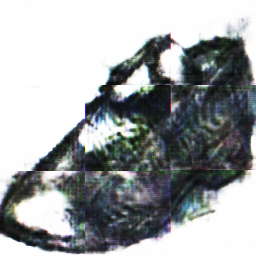

Shoe Loss : 5673.251
Real Edge:


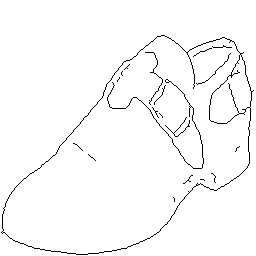

Generated Edge:


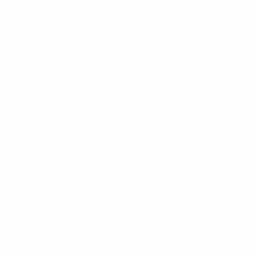

Edge Loss : 1423.6171
Epoch : 0 Index :  700
Real Shoe:


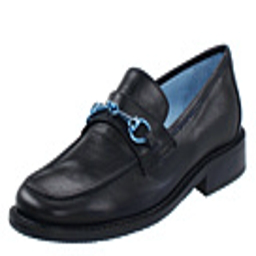

Generated Shoe:


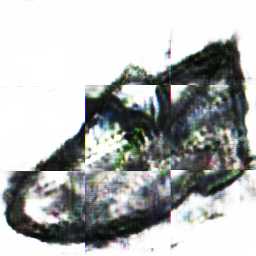

Shoe Loss : 5363.0225
Real Edge:


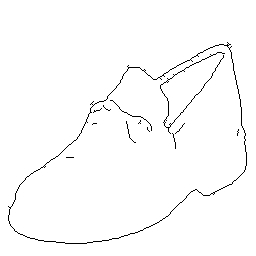

Generated Edge:


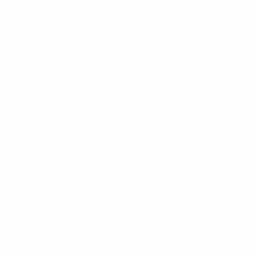

Edge Loss : 1012.8921
Epoch : 0 Index :  710
Real Shoe:


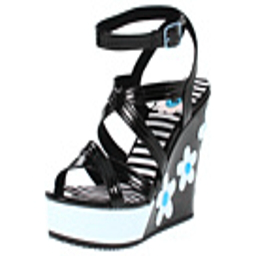

Generated Shoe:


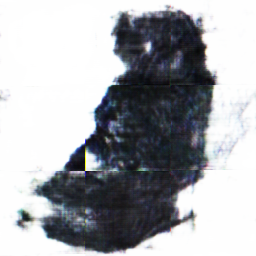

Shoe Loss : 7635.0654
Real Edge:


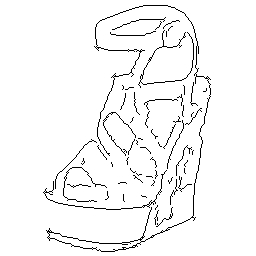

Generated Edge:


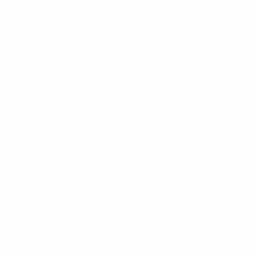

Edge Loss : 2351.1543
Epoch : 0 Index :  720
Real Shoe:


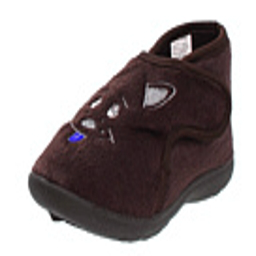

Generated Shoe:


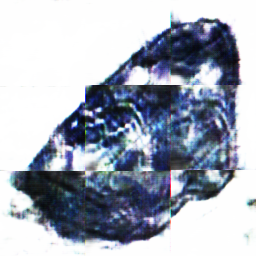

Shoe Loss : 5582.1943
Real Edge:


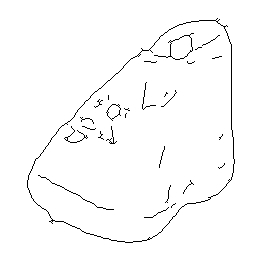

Generated Edge:


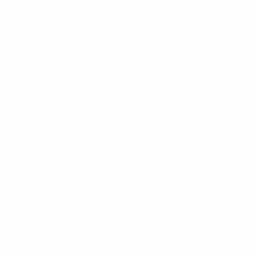

Edge Loss : 1231.1952
Epoch : 0 Index :  730
Real Shoe:


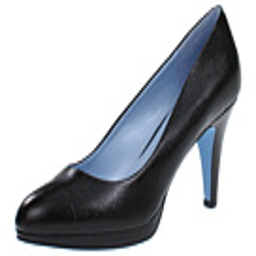

Generated Shoe:


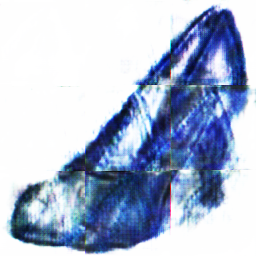

Shoe Loss : 4777.9453
Real Edge:


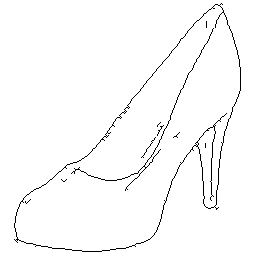

Generated Edge:


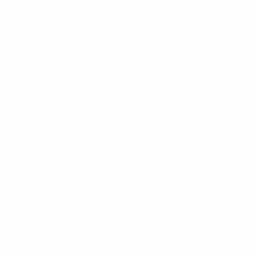

Edge Loss : 1281.8073
Epoch : 0 Index :  740
Real Shoe:


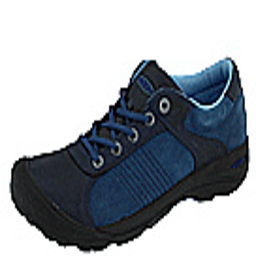

Generated Shoe:


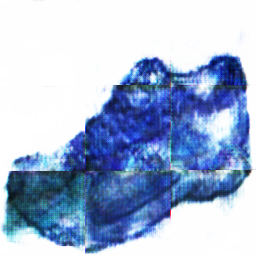

Shoe Loss : 4669.68
Real Edge:


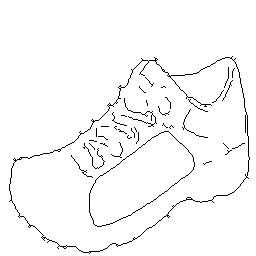

Generated Edge:


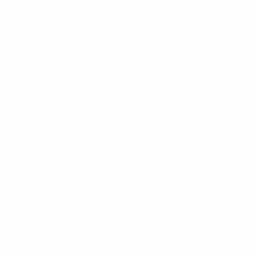

Edge Loss : 1663.7148
Epoch : 0 Index :  750
Real Shoe:


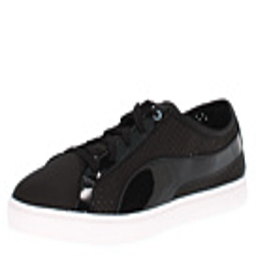

Generated Shoe:


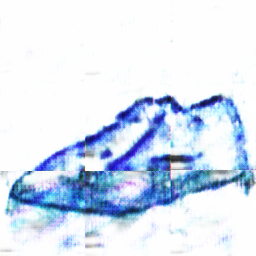

Shoe Loss : 7061.8765
Real Edge:


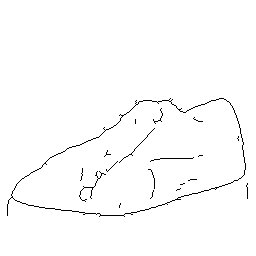

Generated Edge:


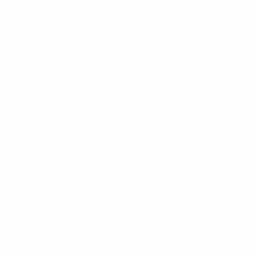

Edge Loss : 893.8717
Epoch : 0 Index :  760
Real Shoe:


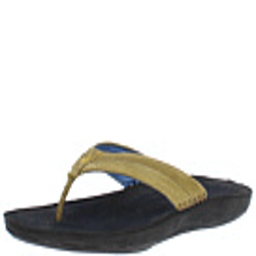

Generated Shoe:


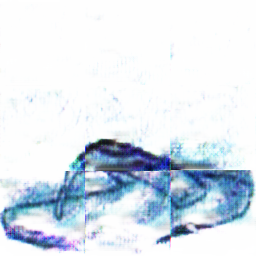

Shoe Loss : 5615.448
Real Edge:


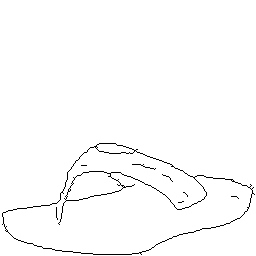

Generated Edge:


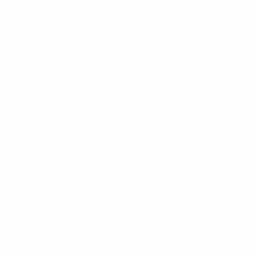

Edge Loss : 986.1261
Epoch : 0 Index :  770
Real Shoe:


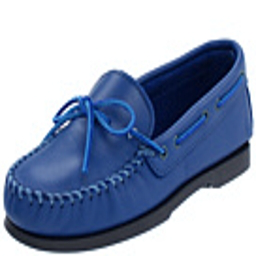

Generated Shoe:


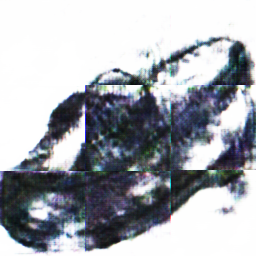

Shoe Loss : 5471.801
Real Edge:


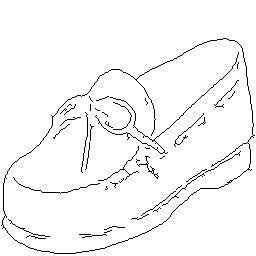

Generated Edge:


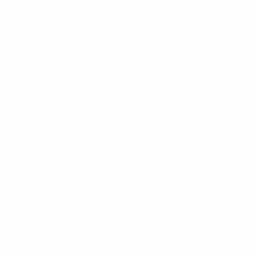

Edge Loss : 2022.8052
Epoch : 0 Index :  780
Real Shoe:


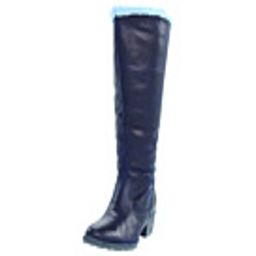

Generated Shoe:


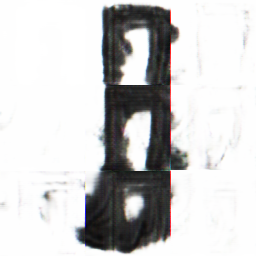

Shoe Loss : 5726.2734
Real Edge:


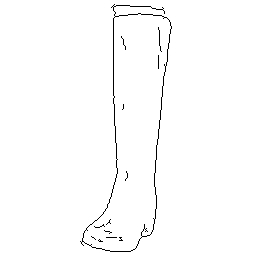

Generated Edge:


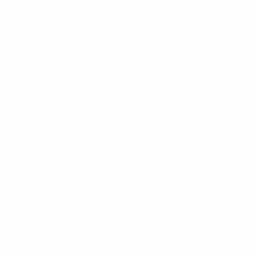

Edge Loss : 787.68713
Epoch : 0 Index :  790
Real Shoe:


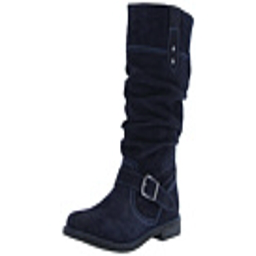

Generated Shoe:


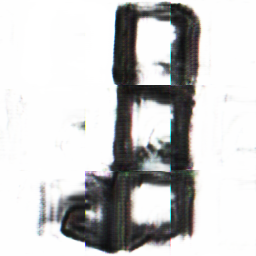

Shoe Loss : 7497.1074
Real Edge:


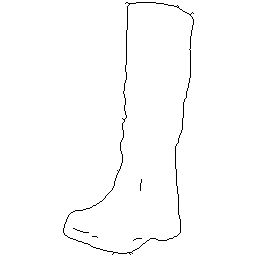

Generated Edge:


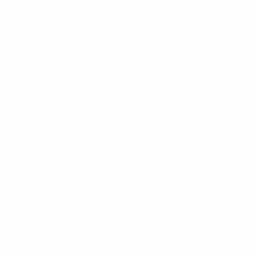

Edge Loss : 699.40155
Epoch : 0 Index :  800
Real Shoe:


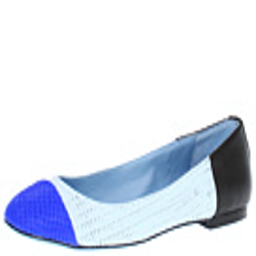

Generated Shoe:


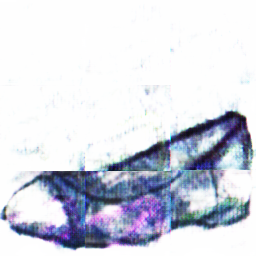

Shoe Loss : 3965.152
Real Edge:


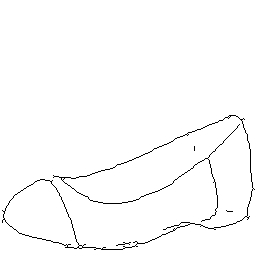

Generated Edge:


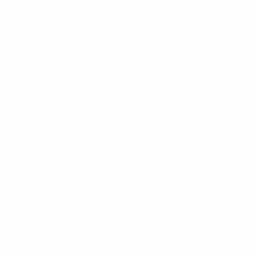

Edge Loss : 1019.84924
Epoch : 0 Index :  810
Real Shoe:


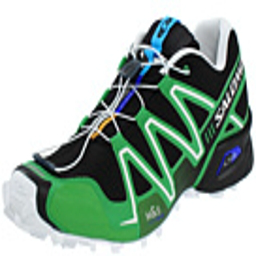

Generated Shoe:


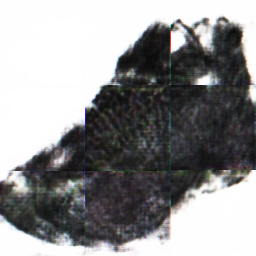

Shoe Loss : 5067.6426
Real Edge:


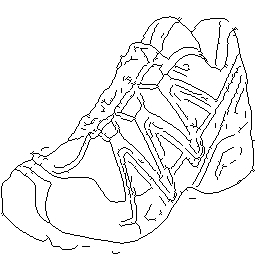

Generated Edge:


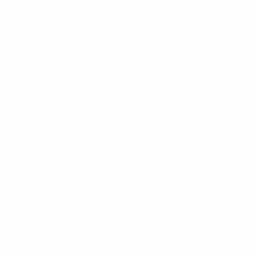

Edge Loss : 3662.5352
Epoch : 0 Index :  820
Real Shoe:


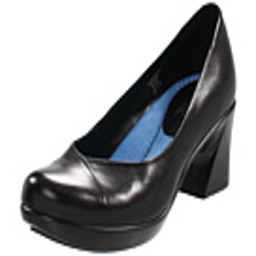

Generated Shoe:


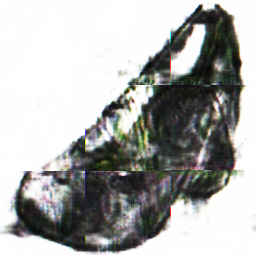

Shoe Loss : 5055.064
Real Edge:


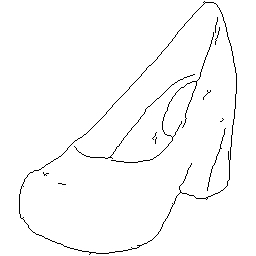

Generated Edge:


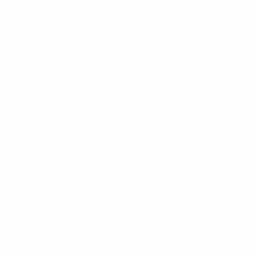

Edge Loss : 1228.2336
Epoch : 0 Index :  830
Real Shoe:


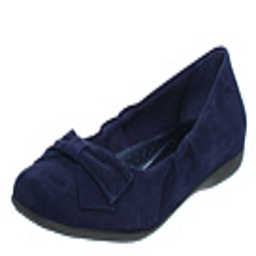

Generated Shoe:


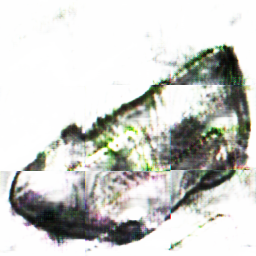

Shoe Loss : 8383.596
Real Edge:


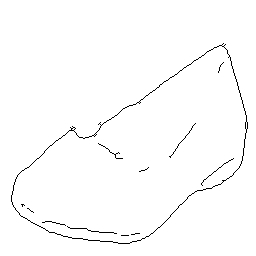

Generated Edge:


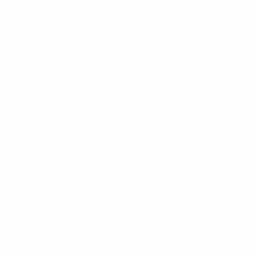

Edge Loss : 850.25635
Epoch : 0 Index :  840
Real Shoe:


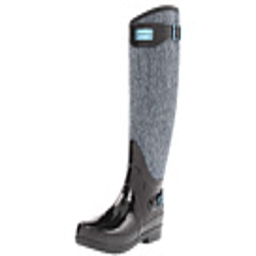

Generated Shoe:


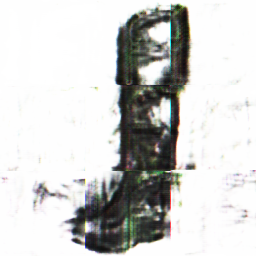

Shoe Loss : 3878.9785
Real Edge:


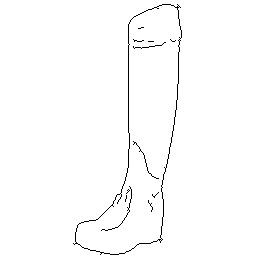

Generated Edge:


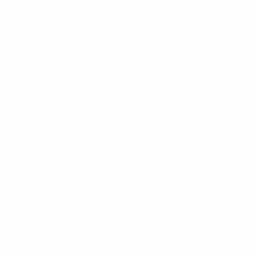

Edge Loss : 834.3176
Epoch : 0 Index :  850
Real Shoe:


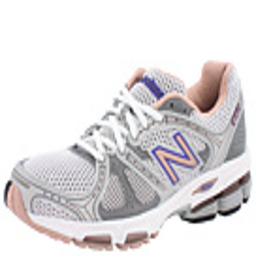

Generated Shoe:


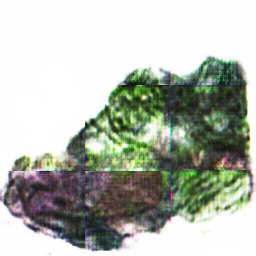

Shoe Loss : 6230.9116
Real Edge:


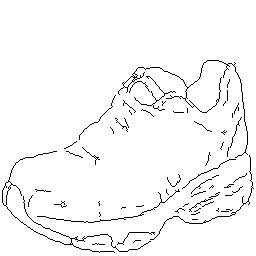

Generated Edge:


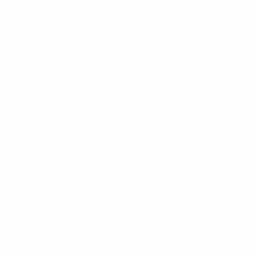

Edge Loss : 2049.4937
Epoch : 0 Index :  860
Real Shoe:


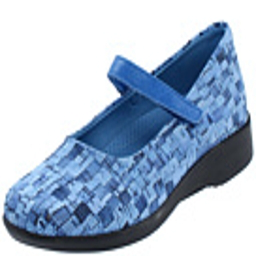

Generated Shoe:


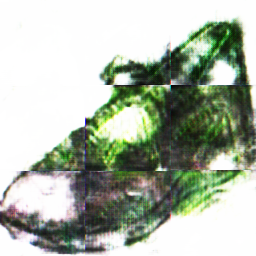

Shoe Loss : 5784.8164
Real Edge:


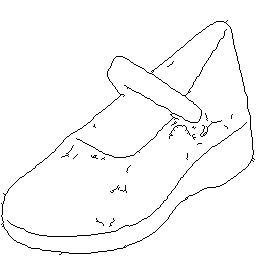

Generated Edge:


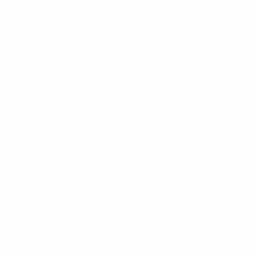

Edge Loss : 1531.8005
Epoch : 0 Index :  870
Real Shoe:


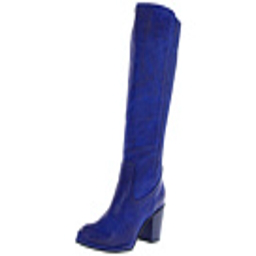

Generated Shoe:


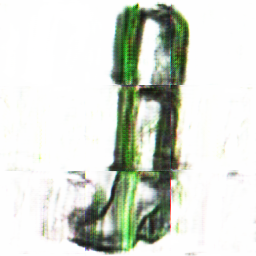

Shoe Loss : 4635.952
Real Edge:


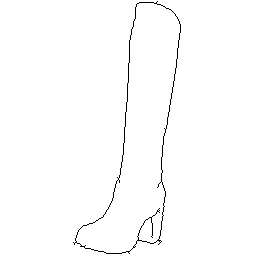

Generated Edge:


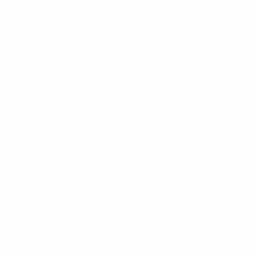

Edge Loss : 684.5402
Epoch : 0 Index :  880
Real Shoe:


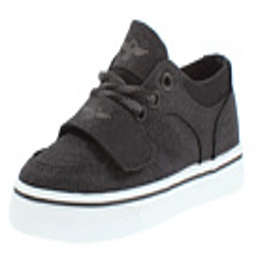

Generated Shoe:


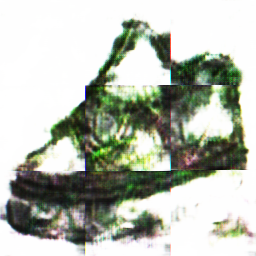

Shoe Loss : 7602.215
Real Edge:


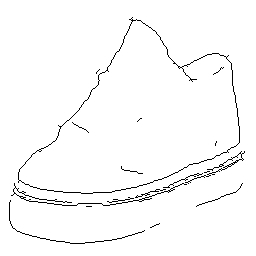

Generated Edge:


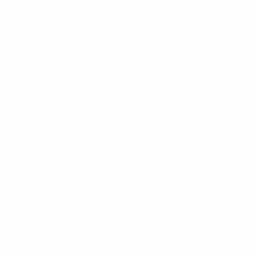

Edge Loss : 1467.2205
Epoch : 0 Index :  890
Real Shoe:


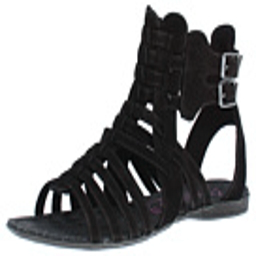

Generated Shoe:


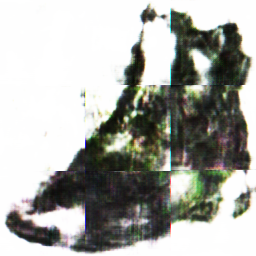

Shoe Loss : 7310.6416
Real Edge:


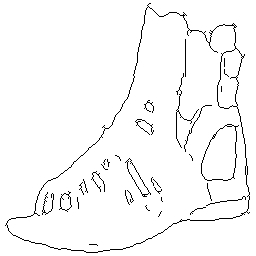

Generated Edge:


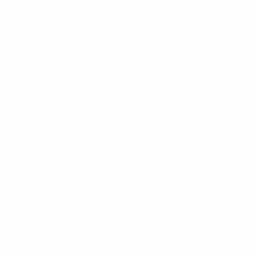

Edge Loss : 1901.7034
Epoch : 0 Index :  900
Real Shoe:


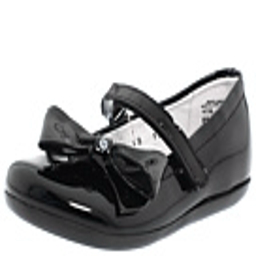

Generated Shoe:


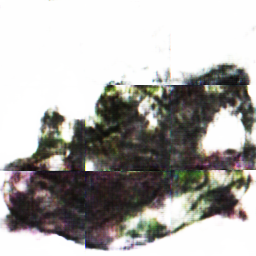

Shoe Loss : 4998.502
Real Edge:


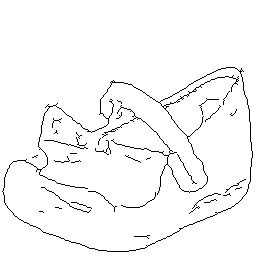

Generated Edge:


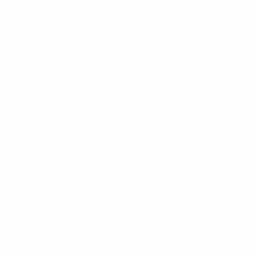

Edge Loss : 1934.5212
Epoch : 0 Index :  910
Real Shoe:


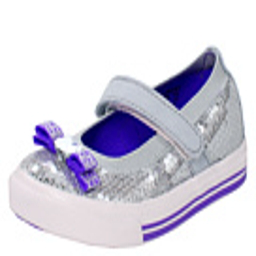

Generated Shoe:


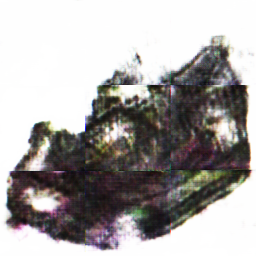

Shoe Loss : 7874.2964
Real Edge:


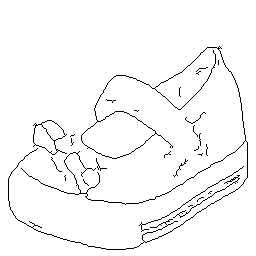

Generated Edge:


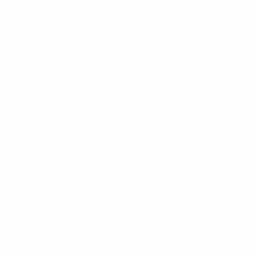

Edge Loss : 1873.063
Epoch : 0 Index :  920
Real Shoe:


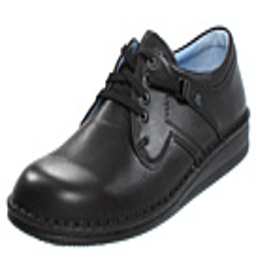

Generated Shoe:


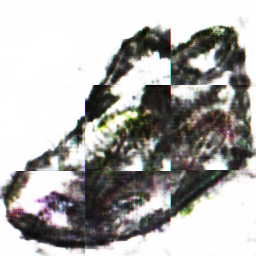

Shoe Loss : 6132.947
Real Edge:


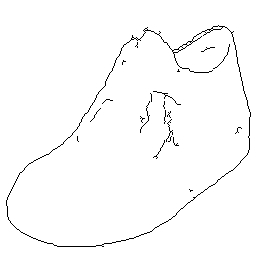

Generated Edge:


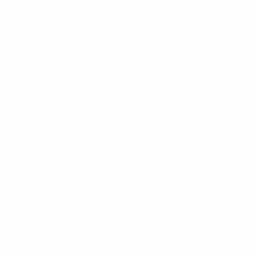

Edge Loss : 1092.3505
Epoch : 0 Index :  930
Real Shoe:


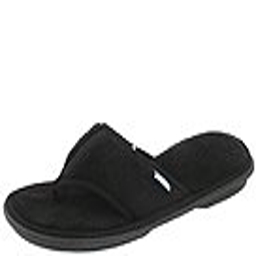

Generated Shoe:


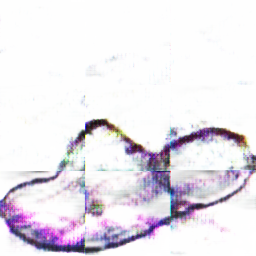

Shoe Loss : 9544.994
Real Edge:


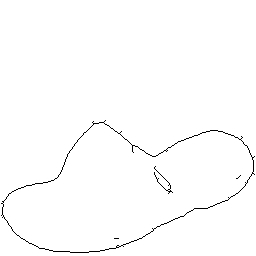

Generated Edge:


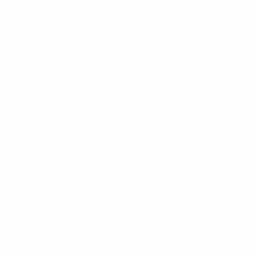

Edge Loss : 660.73193
Epoch : 0 Index :  940
Real Shoe:


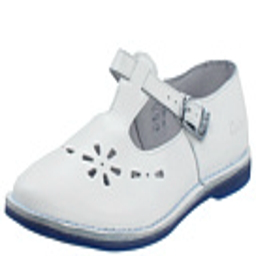

Generated Shoe:


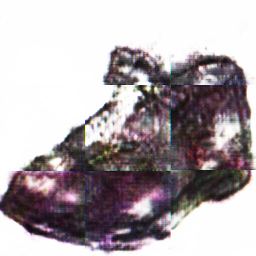

Shoe Loss : 8300.432
Real Edge:


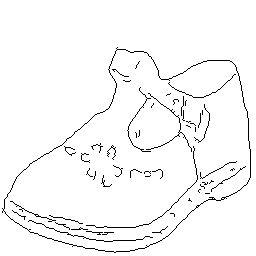

Generated Edge:


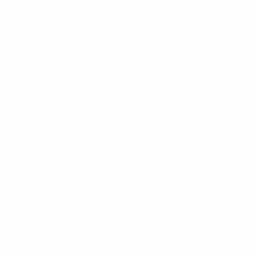

Edge Loss : 1980.1765
Epoch : 0 Index :  950
Real Shoe:


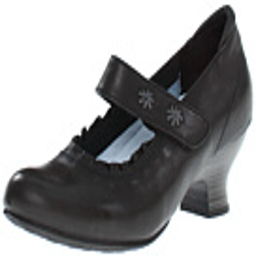

Generated Shoe:


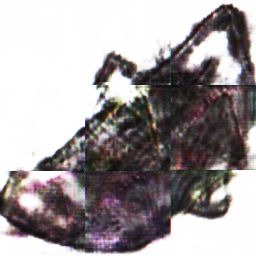

Shoe Loss : 4896.28
Real Edge:


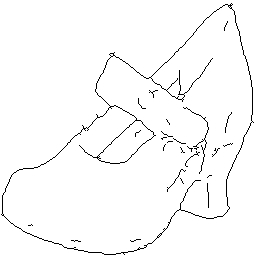

Generated Edge:


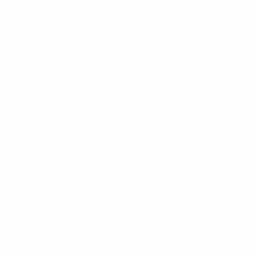

Edge Loss : 1504.0098
Epoch : 0 Index :  960
Real Shoe:


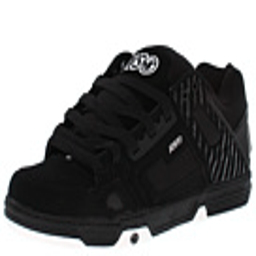

Generated Shoe:


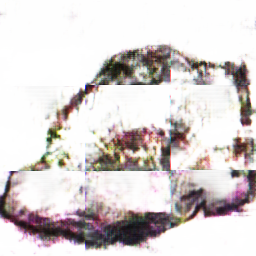

Shoe Loss : 17217.607
Real Edge:


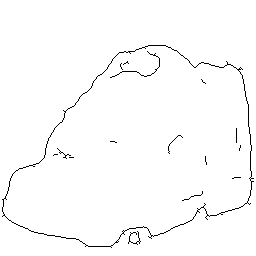

Generated Edge:


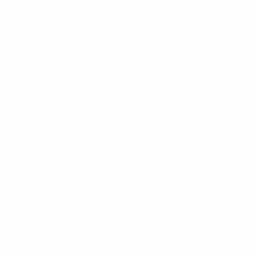

Edge Loss : 1002.00525
Epoch : 0 Index :  970
Real Shoe:


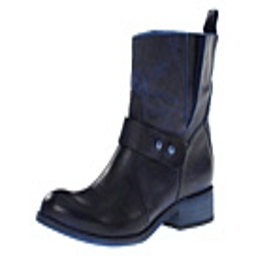

Generated Shoe:


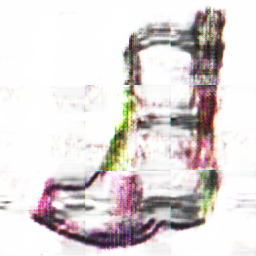

Shoe Loss : 7989.0366
Real Edge:


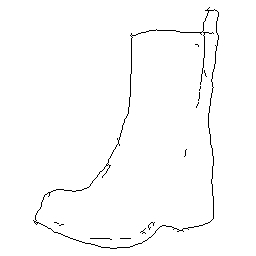

In [ ]:
#disc_optim = optim.Adam(list(disc1.parameters())+list(disc2.parameters() )  , lr=0.001,betas=(0.5, 0.999))
#gen_optim = optim.Adam(list(gen1.parameters())+list(gen2.parameters() )  ,lr=0.0003,betas=(0.5, 0.999) )
disc_optim = optim.Adam(list(disc1.parameters())+list(disc2.parameters() )  , lr=0.001,betas=(0.5, 0.999))
gen_optim = optim.Adam(list(gen1.parameters())+list(gen2.parameters() )  ,lr=0.0001,betas=(0.5, 0.999) )
for epoch in range(epochs):
  

  
  # randomly samples data of size [ batch_size , 3, 256, 256]
  for index, (edges, shoes) in enumerate(data_loader):


    # Normalize to from 0-255 to -1 to 1
    e =  normalize(edges.float()).to(device) # train data (real edges)
    s = normalize(shoes.float()).to(device) # label Data (real shoes)
    
    g1_of_e = gen1(e) # inputed real, outputs of g1 (fake shoes)
    g2_of_s = gen2(s) # inputed real, outputs of g2 (fake edges)
    
    
    
    ### train disc1
    
    ## shoe discriminator
    d1_of_s = disc1(s) # inputed real, outputs of disc1
    d1_of_g1_of_e = disc1(g1_of_e.detach() )# inputed fakes, outputs of dic1 # repeat again for gen
    

    disc1_real_loss = mse(d1_of_s,torch.ones_like(d1_of_s) ) # making disc attain 1 for real inputs 
    disc1_fake_loss =  mse(d1_of_g1_of_e, torch.zeros_like(d1_of_g1_of_e)) # making disc attain 0 for fake inputs

    disc1_loss = (disc1_real_loss+disc1_fake_loss)/2
    
    
    ### train disc2
    
    ## edge discriminator
    d2_of_e = disc2(e) # inputed real, outputs of dic2
    d2_of_g2_of_s = disc2(g2_of_s.detach())  # inputed fakes, outputs of dic2 # repeat again for gen

    disc2_real_loss = mse(d2_of_e,torch.ones_like(d2_of_e) ) # making disc attain 1 for real inputs
    disc2_fake_loss =  mse(d2_of_g2_of_s, torch.zeros_like(d2_of_g2_of_s)) # making disc attain 0 for fake inputs


    disc2_loss = (disc2_real_loss+disc2_fake_loss)/2
    
    ## step both desc together

    disc_loss = (disc1_loss + disc2_loss)/2
    disc_optim.zero_grad()
    disc_loss.backward()
    disc_optim.step()
    ########################################################################################################################
  
    d1_of_g1_of_e = disc1(g1_of_e) # putting fake shoes in shoe disciminator
    d2_of_g2_of_s = disc2(g2_of_s)  # putting fake edges in edge disciminator
    ### Train G1
    # edge to shoe generator
    gen1_loss = mse(d1_of_g1_of_e,torch.ones_like(d1_of_g1_of_e) )     


  

    ### Train G2
    
    # shoe to edge generator
    gen2_loss = mse(d2_of_g2_of_s,torch.ones_like(d2_of_g2_of_s) )

    


    ### Train G1 --> G2
    

    
    g2_of_g1_of_e = gen2(g1_of_e) # putting fake shoes to generate fake edges
    cyc_loss_g1 = L1(g2_of_g1_of_e, e ) # cyclic loss for edges
    g1_to_g2_loss =  lambda_ *cyc_loss_g1
    


 
    ### Train G2 --> G1
    
    #pdb.set_trace()
    g1_of_g2_of_s = gen1(g2_of_s) # putting fake  edges to generate fake shoes
    cyc_loss_g2 = L1(  g1_of_g2_of_s, s ) # cylclic loss for shoes
    g2_to_g1_loss = lambda_*cyc_loss_g2

    # Stepping both generators together:
    gen_loss = gen1_loss+ gen2_loss + g1_to_g2_loss + g2_to_g1_loss
    gen_optim.zero_grad()
    gen_loss.backward()
    gen_optim.step()
                                                                                                                                                                                            
                         
    if index%10==0:#if True:#if epoch%5==0:
      edge_sample,shoe_sample= sample(1)
      edge_sample = edge_sample.to(device)
      shoe_sample = shoe_sample.to(device)
      generated_shoe = denormalize(gen1(edge_sample))
      loss_s = mse(generated_shoe, shoe_sample)
      generated_edge = denormalize(gen2(shoe_sample))
      loss_e = mse(generated_edge, edge_sample)
      print('Epoch :',epoch, "Index : ", index)
      print("Real Shoe:")
      cv2_imshow(shoe_sample.cpu().detach().numpy().reshape(256, 256, 3))
      print("Generated Shoe:") 
      cv2_imshow(generated_shoe.cpu().detach().numpy().reshape(256, 256, 3))
      print('Shoe Loss :',loss_s.cpu().detach().numpy()) 
      print("Real Edge:")
      cv2_imshow(edge_sample.cpu().detach().numpy().reshape(256, 256, 3))
      print("Generated Edge:") 
      cv2_imshow(generated_edge.cpu().detach().numpy().reshape(256, 256, 3))
      print('Edge Loss :',loss_e.cpu().detach().numpy()) 

torch.Size([1, 3, 256, 256])
torch.Size([1, 3, 256, 256])
Real:


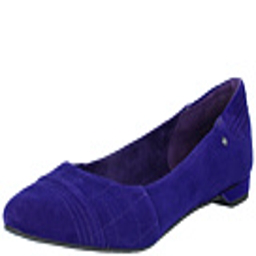

Generated:


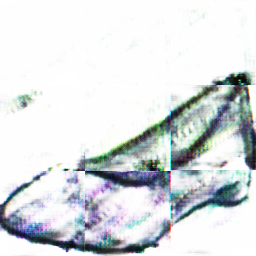

In [37]:
t,l = sample(1)          
true = l.to(device)
t = t.to(device)   
print(t.shape)                   
generated = denormalize(gen1(t.reshape(1,3,256,256)))           
print(generated.shape)               
print("Real:")              
cv2_imshow(true.cpu().detach().numpy().reshape(256, 256, 3))   
print("Generated:")    
cv2_imshow(generated.cpu().detach().numpy().reshape(256, 256, 3)) 
  